### Import of modules

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance  # Needed for RBF
import os
# Modules required for MCMC
import jax
import jax.numpy as jnp  # Use instead of numpy 'np' in numpyro model functions, e.g. RBF
import numpyro
import torch
import torch.nn as nn
import torch.functional as F

import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, Predictive
from numpyro import render_model
import arviz as az
import csv
import setup_cw2 as setup
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
# Change this if you are brave!
jax.config.update('jax_platform_name', 'cpu')
# This next line throws up a pointless unnecessary warning, but suppresses a more annoying one later
print(jax.devices())
# Uncomment if necessary - otherwise, jax defaults to 32-bit
# jax.config.update("jax_enable_x64", True)

print(f"Using version {numpyro.__version__} of numpyro")

[CpuDevice(id=0)]
Using version 0.18.0 of numpyro


### small amount of processing  - features standardised being features is purposefully done, not for any good reason

In [22]:
df = pd.read_csv('component-data-2c.csv')
#print(df[df['ID']=='K#0000']['day'])
features = jnp.array(df[['X1','X2','X3','X4','X5']].to_numpy())
features_unique = jnp.unique(features, axis=0)

features_mean = jnp.mean(features, axis=0)
features_std = jnp.std(features, axis=0)

features_standardised = features

filter = lambda x: df.loc[df['index']==x].index
print(features_unique.shape)

print(features_unique)

(75, 5)
[[ 0.14   5.254  0.136  1.992  6.008]
 [ 0.202  0.364  0.679  0.854  0.574]
 [ 0.313  0.55   1.455  0.49   4.568]
 [ 0.318  0.163  0.858  0.269  0.408]
 [ 0.349  2.801  0.369  1.045  4.729]
 [ 0.354  1.266  4.318  1.321  0.78 ]
 [ 0.448  2.945  0.749  1.087  0.428]
 [ 0.45   0.863  0.792  0.544 12.921]
 [ 0.465  2.518  1.826  1.075  1.166]
 [ 0.47   5.415  0.75   4.828  0.649]
 [ 0.479  0.348  0.36   0.263  0.134]
 [ 0.494  1.532  2.11   1.171  5.548]
 [ 0.503  3.593  1.377  0.533  0.25 ]
 [ 0.504  0.509  1.815  0.55   2.154]
 [ 0.521  0.349  0.515  2.92   1.454]
 [ 0.529  1.426  0.854  0.683  1.31 ]
 [ 0.574  1.037  0.286  1.919  0.982]
 [ 0.575  1.759  0.372  1.064  2.533]
 [ 0.614  1.807  1.315  1.351  2.869]
 [ 0.62   0.593  0.08   0.235  0.175]
 [ 0.621  0.686  1.889  2.032  0.984]
 [ 0.659  0.908  1.67   0.162  2.214]
 [ 0.662  1.177  2.027  1.473  1.407]
 [ 0.663  0.83   0.138  0.456  0.338]
 [ 0.688  3.073  0.641  0.283  2.333]
 [ 0.699  1.386  1.143  1.109  1.345]
 [ 0

### More processing + baseline model creation 

In [23]:
time_list = df['day'].to_numpy()

integrity = df['integrity'].to_numpy()
id = df['ID'].to_numpy()
id_correct = []
for i in id:
    if i[2] == 0:
        if i[3] == 0:
            if i[4] == 0:
                if i[5] == 0:    
                    id_correct.append(i[5:])
            else:
                id_correct.append(i[4:])
        else:
            id_correct.append(i[3:])
    else:
        id_correct.append(i[2:])
    
id_correct2 = []

for i in id_correct:
    id_correct2.append(int(i))



t_array = jnp.array(time_list)
integrity = jnp.array(integrity)
id_model = jnp.array(id_correct2)

def baseline_model(k, y, t):
    
    mean_u = numpyro.sample('Mean U', dist.Normal(90, 10))
    sigma_u = numpyro.sample('Sigma U', dist.HalfNormal(10))
    mean_v = numpyro.sample('Mean V', dist.Normal(5.5, 10))
    sigma_v = numpyro.sample('Sigma V', dist.HalfNormal(10))
    
    with numpyro.plate('Components', 75):
        u = numpyro.sample('U', dist.Normal(mean_u, sigma_u))
        v = numpyro.sample('V', dist.Normal(mean_v, sigma_v))

    u_i = u[k]
    v_i = v[k]

    sigma_y = numpyro.sample('Sigma Y', dist.HalfNormal(5))
    epsilon_y = numpyro.sample('Epsilon', dist.Normal(0, sigma_y))
    y_predict = u_i * jnp.exp((-v_i * t)/100)

    with numpyro.plate('Observations', 879):
        numpyro.sample('Obs', dist.Normal(y_predict, epsilon_y), obs=y)

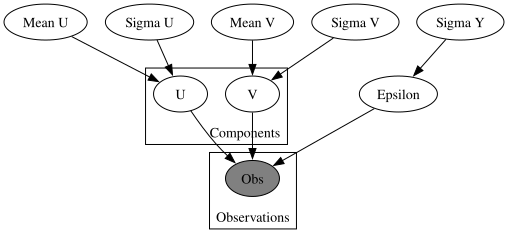

In [4]:
os.environ['PATH'] += os.pathsep + '/opt/homebrew/bin'

numpyro.render_model(baseline_model, model_args=(id_model,integrity, t_array))

### MCMC with NUTS on baseline

sample: 100%|██████████| 2500/2500 [00:11<00:00, 224.30it/s, 31 steps of size 2.29e-01. acc. prob=0.86]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
   Epsilon      5.10      0.14      5.10      4.88      5.32   2850.15      1.00
    Mean U     89.72      0.89     89.72     88.25     91.16   1781.32      1.00
    Mean V      3.92      0.22      3.92      3.58      4.31   2361.27      1.00
   Sigma U      5.24      0.81      5.21      3.96      6.57    844.66      1.00
   Sigma V      1.59      0.17      1.58      1.31      1.86   2058.79      1.00
   Sigma Y      5.46      2.34      4.99      2.15      9.05   2772.78      1.00
      U[0]     94.01      2.30     94.01     90.53     98.03   3980.20      1.00
      U[1]     87.42      4.28     87.42     80.52     94.65   2931.88      1.00
      U[2]     98.51      2.28     98.51     94.77    102.27   2502.03      1.00
      U[3]     89.34      2.08     89.32     85.93     92.79   3639.93      1.00
      U[4]     87.16      3.92     87.20     81.25     94.18   3239.23      1.00
      U[5]     89.46      3

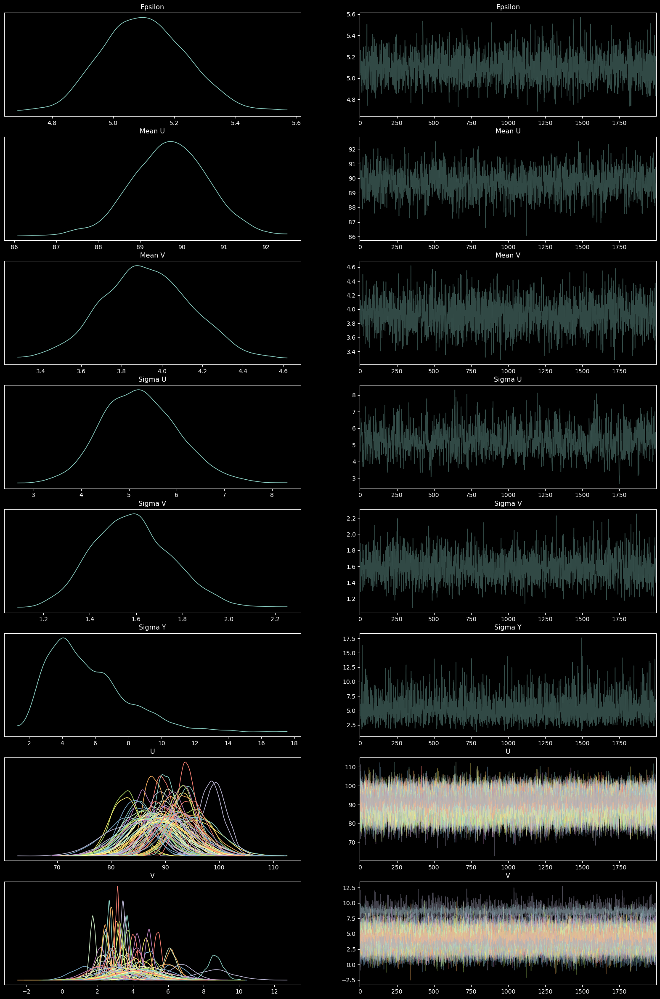

In [24]:
num_warmup = 500
num_samples = 2000

kernel = NUTS(baseline_model)
plt.style.use('default')
mcmc = MCMC(kernel, num_samples=num_samples, num_warmup=num_warmup, num_chains=1)
rng_key = jax.random.key(seed=0)
mcmc.run(rng_key,id_model,integrity,t_array)
samples_baseline = mcmc.get_samples()
mcmc.print_summary()
data = az.from_numpyro(mcmc)
fig= az.plot_trace(data, figsize=(20, 30), compact=True)



### Enhanced model creation

In [25]:
def enhanced_model(k, y, t, x):
    alpha = numpyro.sample('Alpha', dist.HalfNormal(10))
    weights = numpyro.sample('Weights', dist.Normal(0, alpha),sample_shape=(5,))

    #weights = numpyro.sample('weights', dist.MultivariateNormal(weights_mean, covariance_matrix=jnp.identity(5)*weights_std))
    mean_u = numpyro.sample('Mean U', dist.Normal(90, 10))
    sigma_u = numpyro.sample('Sigma U', dist.HalfNormal(10))
    mean_v = numpyro.sample('Mean V', dist.Normal(3.5, 10))
    sigma_v = numpyro.sample('Sigma V', dist.HalfNormal(10))
    
    with numpyro.plate('components', 75):
        u = numpyro.sample('U', dist.Normal(mean_u, sigma_u))
        v = numpyro.sample('V', dist.Normal(mean_v, sigma_v))
    
    u_i = u[k]
    v_i = v[k]
    
    weights_summed = jnp.dot(x, weights)

    sigma_y = numpyro.sample('Sigma Y', dist.HalfNormal(5))

    epsilon_y = numpyro.sample('Epsilon', dist.Normal(0, sigma_y))
    y_predict = u_i * jnp.exp(-(v_i + weights_summed) * t/100)
    
    with numpyro.plate('Observations', 879):
        numpyro.sample('Obs', dist.Normal(y_predict, epsilon_y), obs=y)




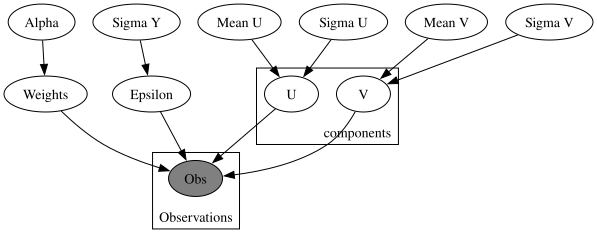

In [26]:
numpyro.render_model(enhanced_model, model_args=(id_model, integrity, t_array, features_standardised))

### MCMC and NUTS on enhanced

sample: 100%|██████████| 5000/5000 [00:24<00:00, 203.81it/s, 31 steps of size 1.44e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
     Alpha      0.67      0.33      0.60      0.29      1.03   1355.19      1.00
   Epsilon      5.09      0.13      5.08      4.87      5.29   3830.66      1.00
    Mean U     90.37      0.79     90.38     89.02     91.63   1322.56      1.00
    Mean V      2.00      0.15      2.00      1.75      2.24    178.22      1.02
   Sigma U      4.81      0.61      4.77      3.84      5.82   1065.96      1.00
   Sigma V      0.34      0.07      0.34      0.23      0.45    366.69      1.00
   Sigma Y      5.56      2.45      5.07      1.94      9.10   3147.79      1.00
      U[0]     94.22      2.07     94.25     90.71     97.44   3193.29      1.00
      U[1]     91.73      3.87     91.71     85.42     97.99   2844.64      1.00
      U[2]     98.43      2.14     98.41     94.79    101.78   2956.02      1.00
      U[3]     89.34      1.96     89.33     86.08     92.52   3289.12      1.00
      U[4]     89.64      3

array([[<Axes: title={'center': 'Epsilon'}>,
        <Axes: title={'center': 'Epsilon'}>],
       [<Axes: title={'center': 'Mean U'}>,
        <Axes: title={'center': 'Mean U'}>],
       [<Axes: title={'center': 'Mean V'}>,
        <Axes: title={'center': 'Mean V'}>],
       [<Axes: title={'center': 'Sigma U'}>,
        <Axes: title={'center': 'Sigma U'}>],
       [<Axes: title={'center': 'Sigma V'}>,
        <Axes: title={'center': 'Sigma V'}>],
       [<Axes: title={'center': 'Sigma Y'}>,
        <Axes: title={'center': 'Sigma Y'}>],
       [<Axes: title={'center': 'U'}>, <Axes: title={'center': 'U'}>],
       [<Axes: title={'center': 'V'}>, <Axes: title={'center': 'V'}>]],
      dtype=object)

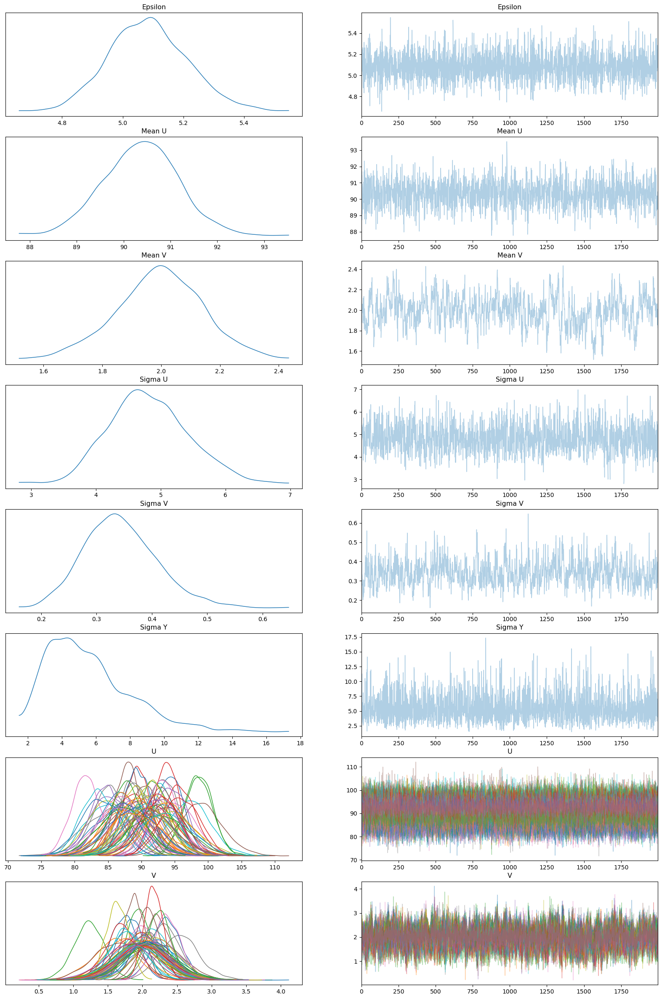

In [27]:
num_warmup = 3000
num_samples = 2000

kernel = NUTS(enhanced_model)
mcmc = MCMC(kernel, num_samples=num_samples, num_warmup=num_warmup)
rng_key = jax.random.key(seed=0)
mcmc.run(rng_key,id_model,integrity, t_array, features_standardised)
samples_enhanced = mcmc.get_samples()
mcmc.print_summary()
data = az.from_numpyro(mcmc)
plt.style.use('default')
az.plot_trace(data, var_names=['Epsilon','Mean U', 'Mean V','Sigma U', 'Sigma V','Sigma Y', 'U', 'V'], figsize=(20, 30), compact=True)

### Plotting weights and alpha

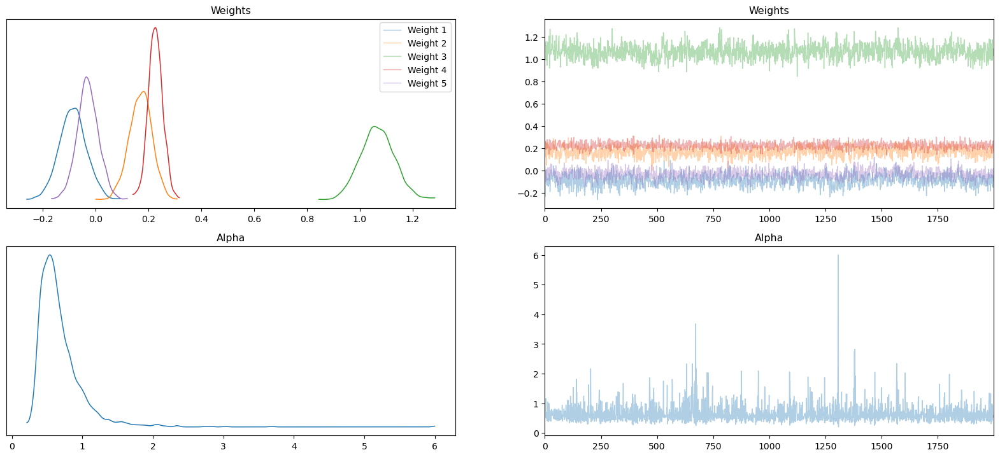

In [28]:
plt.style.use('default')
plt_0, plt_1 = az.plot_trace(data, var_names=['Weights', 'Alpha'], figsize=(20, 8.5), compact=True, combined=False)
label = ['Weight 1', 'Weight 2','Weight 3','Weight 4','Weight 5']
handles, labels = plt_0[0].get_legend_handles_labels()

plt_0[1].legend(labels=label, frameon=True, loc='center right', bbox_to_anchor=(-0.2,0.8))


### Predictions and error bars for BOTH models

In [29]:
def prediction(id):
    weights = samples_enhanced['Weights']
    weights_summed = jnp.dot(weights, features_unique[id]).reshape(-1,1)
    inner_sum = -(samples_enhanced['V'][:, id].reshape(-1, 1) + weights_summed)
    
    time = jnp.arange(0, 61, 1)
    time /= 100
    time = time.reshape(-1, 1)
    
    inner = jnp.dot(inner_sum, time.T)
    exp_inner = jnp.exp(inner)
    prediction = samples_enhanced['U'][:,id].reshape(-1, 1) * exp_inner 
    prediction_full = jnp.mean(prediction, axis=0)
    enhanced_std = jnp.std(prediction, axis=0)
    lower_enhanced = prediction_full - (1.96 * enhanced_std)
    upper_enhanced = prediction_full + (1.96 * enhanced_std)

    neg_v = - samples_baseline['V'][:, id].reshape(-1, 1)
    base_inner = jnp.dot(neg_v, time.T)
    base_exp = jnp.exp(base_inner)
    base_prediction = samples_baseline['U'][:, id].reshape(-1, 1) * base_exp
    base_std = jnp.std(base_prediction, axis=0)
    base_prediction_full = jnp.mean(base_prediction, axis=0)

    lower_base = base_prediction_full - 1.96 * base_std
    upper_base = base_prediction_full + 1.96 * base_std

    mean_noise_var_enhanced = jnp.mean(samples_enhanced['Epsilon']**2, axis=0)
    enhanced_std_with_noise = jnp.sqrt(enhanced_std**2 + mean_noise_var_enhanced)

    mean_noise_base_var = jnp.mean(samples_baseline['Epsilon']**2, axis=0)
    base_noise_std = jnp.sqrt(mean_noise_base_var + base_std**2)

    lower_enhanced_noise = (enhanced_std_with_noise*-1.96) + prediction_full
    upper_enhanced_noise = (enhanced_std_with_noise*1.96) + prediction_full
    
    upper_base_noise = (base_noise_std * 1.96) + base_prediction_full
    lower_base_noise = (base_noise_std * -1.96) + base_prediction_full

    return prediction_full, base_prediction_full, lower_enhanced, upper_enhanced, lower_base, upper_base, lower_enhanced_noise, upper_enhanced_noise, lower_base_noise, upper_base_noise, enhanced_std




### Probability calculation

In [52]:
probabilities =[]


for k in range(50, 75):
    _,enh_p,_,_, lower_enh, upper_enh, _,_,l_e_n, u_e_n, e_std = prediction(k)
    prediction_cdf = dist.Normal(loc=enh_p[30], scale=e_std[30]).cdf(30)
    probabilities.append([f"K#00{k}",k,float("{:.5f}".format(prediction_cdf))])

data = pd.DataFrame(probabilities, columns=['ID', 'index', 'probability'])
print(data)
pd.DataFrame.to_csv(data, 'predictions.csv', index=False)

        ID  index  probability
0   K#0050     50      0.57110
1   K#0051     51      1.00000
2   K#0052     52      1.00000
3   K#0053     53      0.07397
4   K#0054     54      0.05126
5   K#0055     55      0.36678
6   K#0056     56      1.00000
7   K#0057     57      0.00000
8   K#0058     58      0.87323
9   K#0059     59      0.37399
10  K#0060     60      0.92810
11  K#0061     61      0.00062
12  K#0062     62      0.02253
13  K#0063     63      0.00000
14  K#0064     64      0.00000
15  K#0065     65      0.89124
16  K#0066     66      0.52610
17  K#0067     67      0.99999
18  K#0068     68      0.21830
19  K#0069     69      0.51882
20  K#0070     70      0.99872
21  K#0071     71      0.92096
22  K#0072     72      0.46156
23  K#0073     73      0.65401
24  K#0074     74      0.01254


In [12]:
print(probabilities)

[['ID', 'index', 'probability'], ['K#0050', 50, 0.6733611226081848], ['K#0051', 51, 0.9999985694885254], ['K#0052', 52, 0.9998412728309631], ['K#0053', 53, 0.0004089467693120241], ['K#0054', 54, 0.9390019774436951], ['K#0055', 55, 0.01430724747478962], ['K#0056', 56, 1.0], ['K#0057', 57, 1.0], ['K#0058', 58, 0.00012223768862895668], ['K#0059', 59, 0.016539277508854866], ['K#0060', 60, 0.0358930379152298], ['K#0061', 61, 0.0003030535881407559], ['K#0062', 62, 4.727395935333334e-05], ['K#0063', 63, 0.15575659275054932], ['K#0064', 64, 1.0], ['K#0065', 65, 1.0], ['K#0066', 66, 0.9998102188110352], ['K#0067', 67, 0.9968765377998352], ['K#0068', 68, 7.81462513259612e-05], ['K#0069', 69, 0.00041184149449691176], ['K#0070', 70, 0.9998959898948669], ['K#0071', 71, 0.917533278465271], ['K#0072', 72, 1.0], ['K#0073', 73, 0.0023600789718329906], ['K#0074', 74, 0.5346370935440063]]


### Plotting all the components

[1.0 3.0 5.0 7.0 8.0 9.0 10.0 11.0 13.0 14.0 15.0 19.0 21.0 22.0 24.0 25.0
 26.0 29.0 30.0 31.0 32.0 33.0 34.0 36.0 37.0 38.0 41.0 43.0 44.0 45.0]


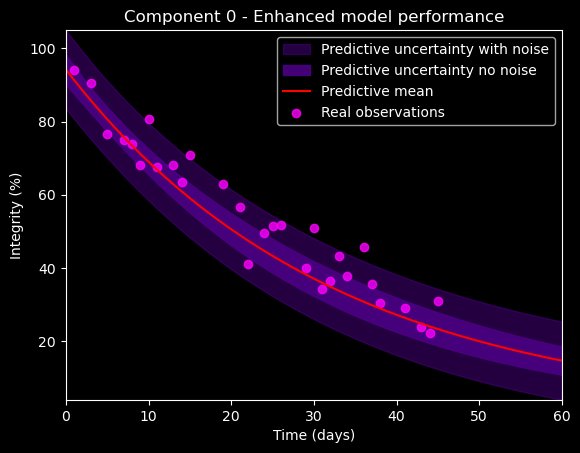

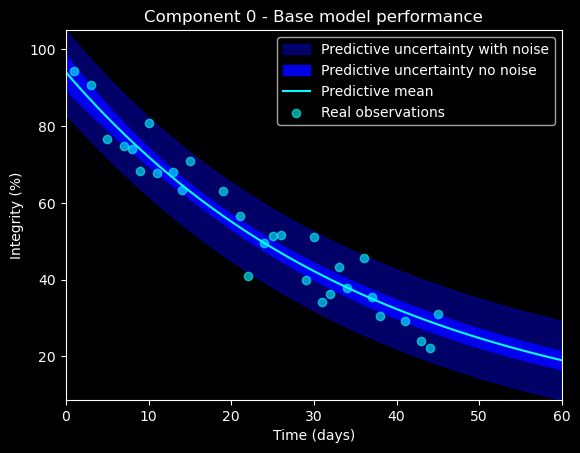

[5.0 15.0 18.0 20.0 24.0 26.0]


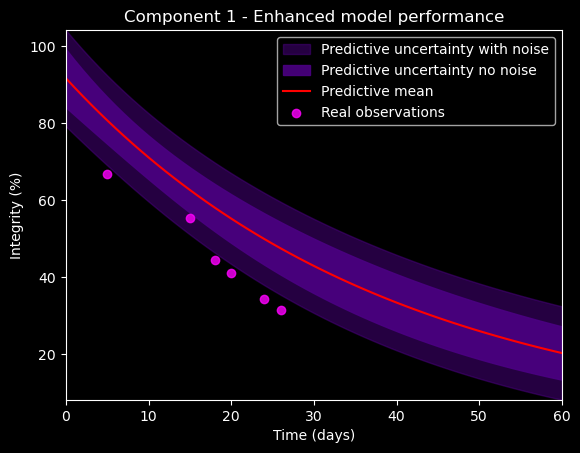

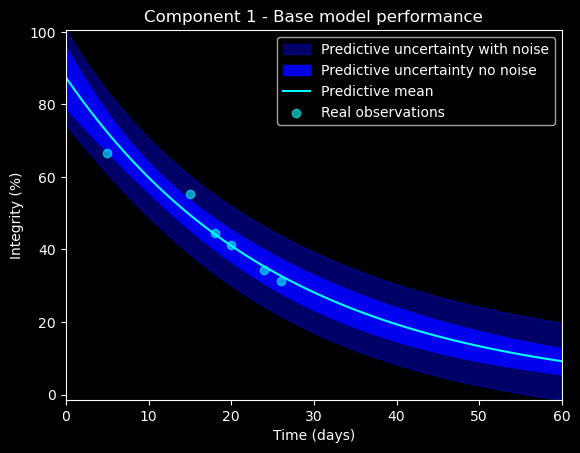

[2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0 14.0 15.0 16.0 17.0 18.0
 19.0 20.0 21.0 22.0 23.0 24.0 25.0 26.0 27.0 28.0 29.0 30.0 31.0 32.0
 33.0 34.0 35.0 36.0 37.0 38.0 39.0 40.0 41.0 42.0 43.0]


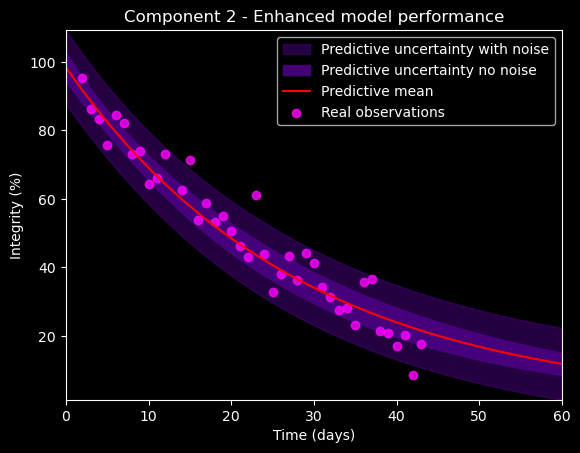

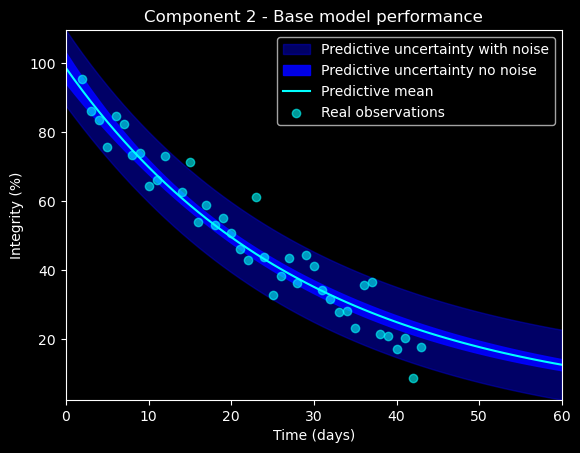

[0.0 1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0
 16.0 17.0 19.0 20.0 23.0 24.0 25.0 26.0 27.0 28.0 29.0 30.0 31.0 32.0
 33.0 34.0 35.0 36.0 37.0 38.0 39.0 41.0 42.0 43.0]


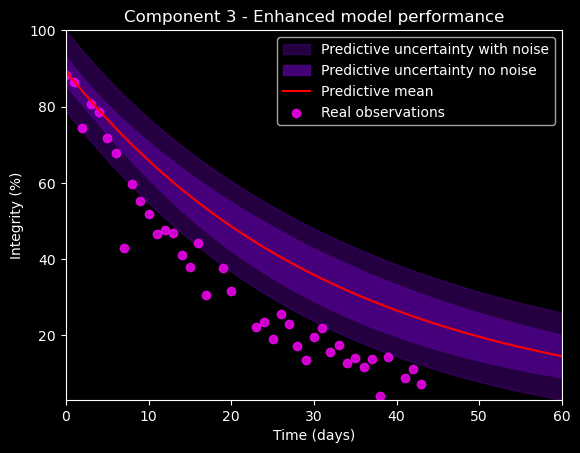

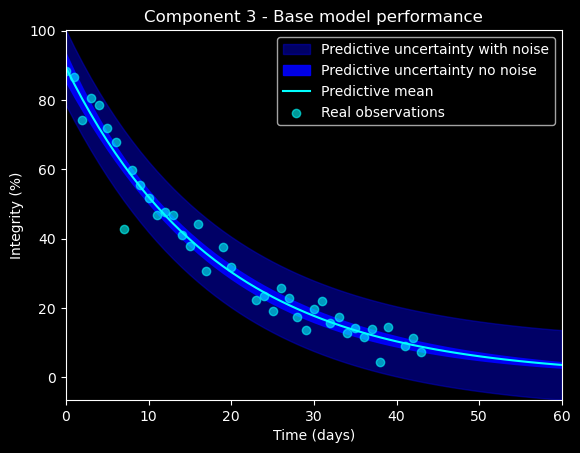

[1.0 9.0 10.0 14.0]


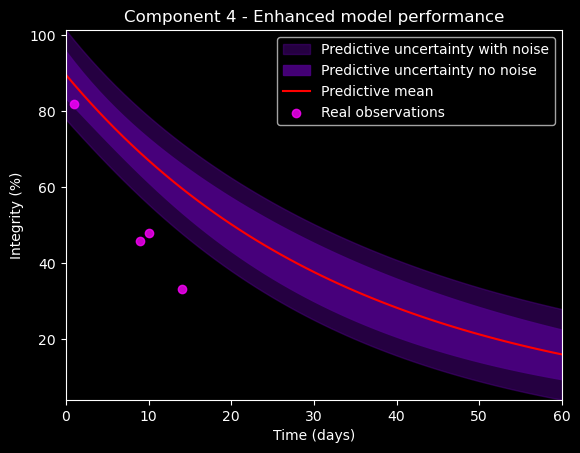

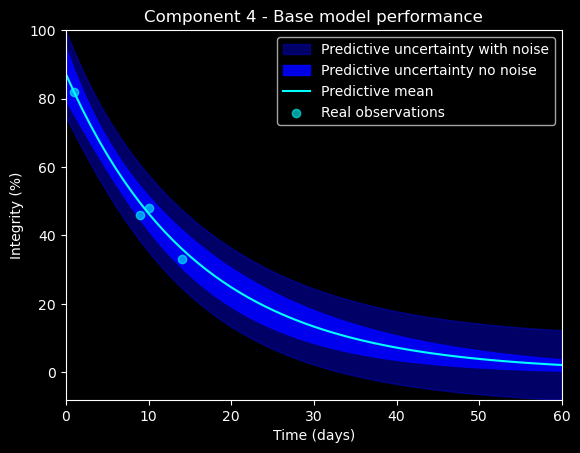

[2.0 13.0 19.0]


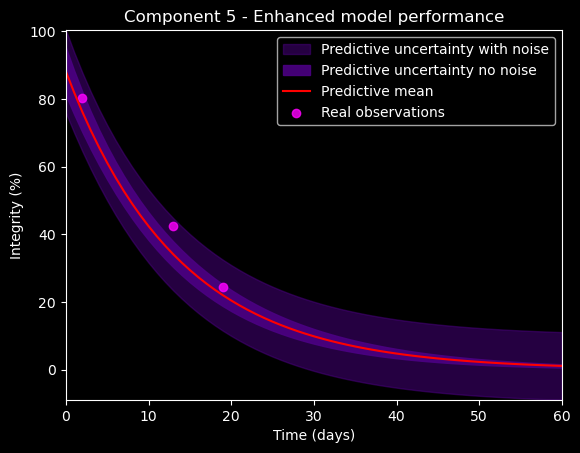

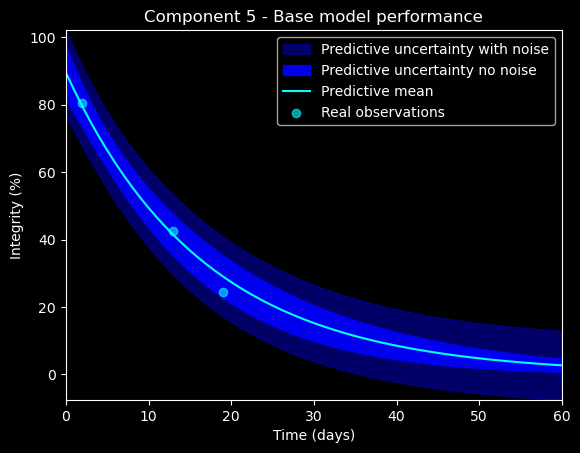

[3.0 4.0 7.0 9.0 10.0 11.0 12.0 16.0 20.0]


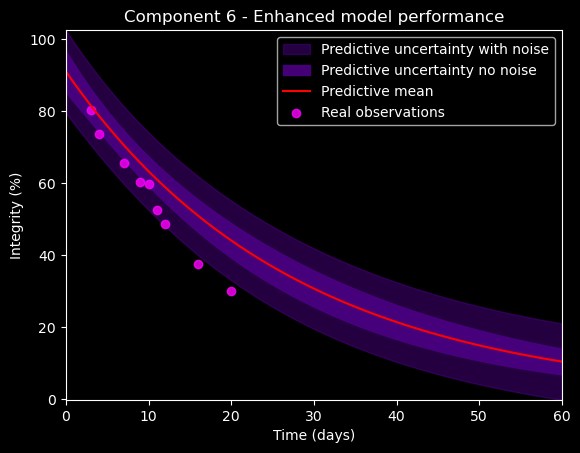

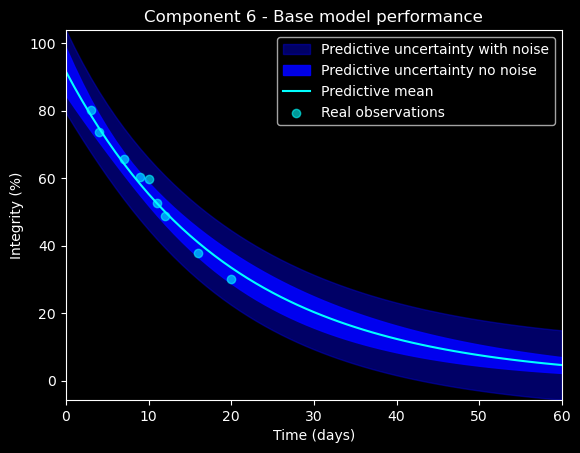

[4.0 27.0 31.0]


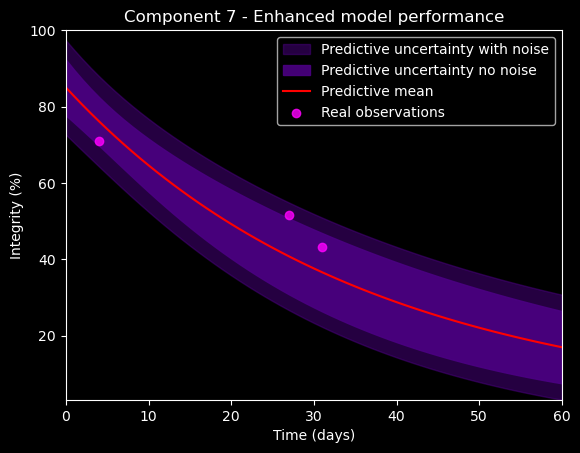

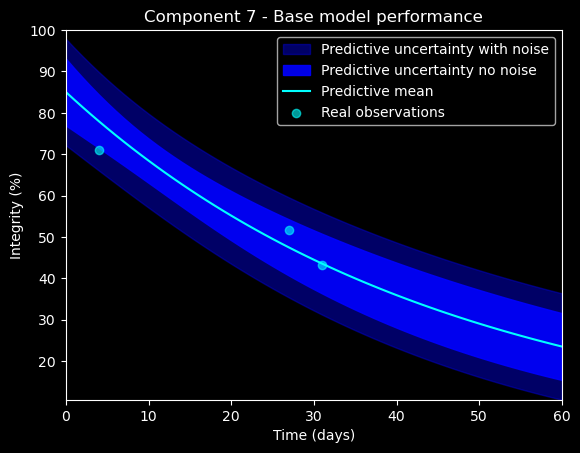

[4.0 8.0 9.0 10.0 11.0 12.0 13.0 16.0 17.0 18.0 20.0 21.0 23.0]


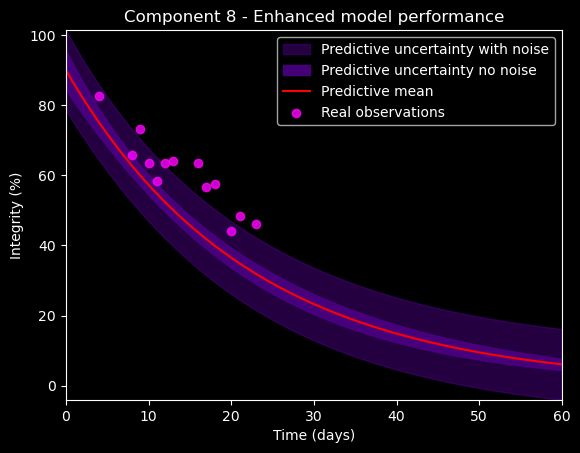

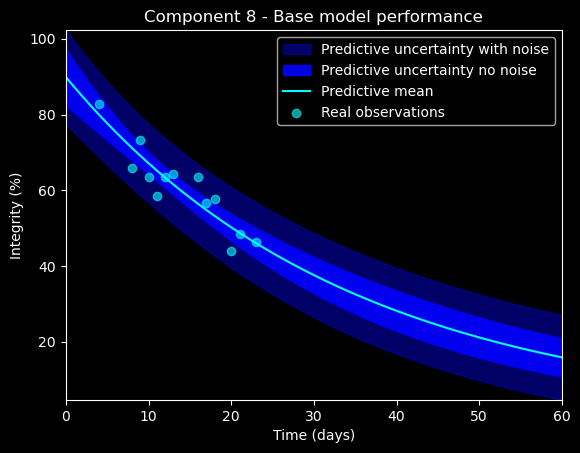

[5.0 6.0 9.0 13.0 18.0 19.0 20.0]


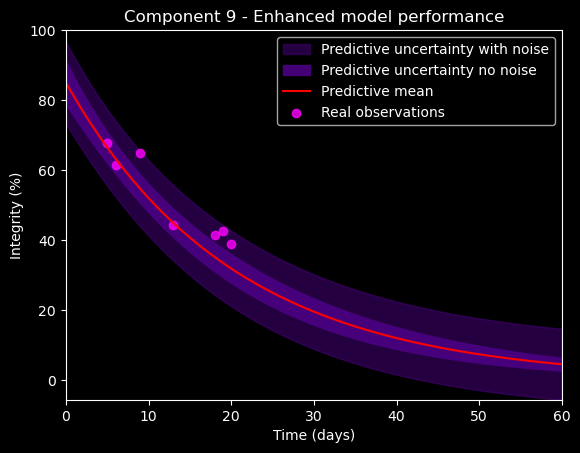

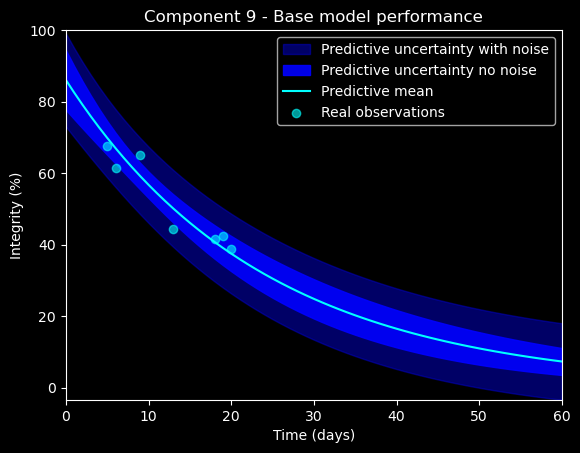

[6.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0 16.0 17.0 19.0 20.0 22.0
 23.0 24.0 25.0 26.0 27.0 28.0 29.0 30.0 31.0 32.0 33.0]


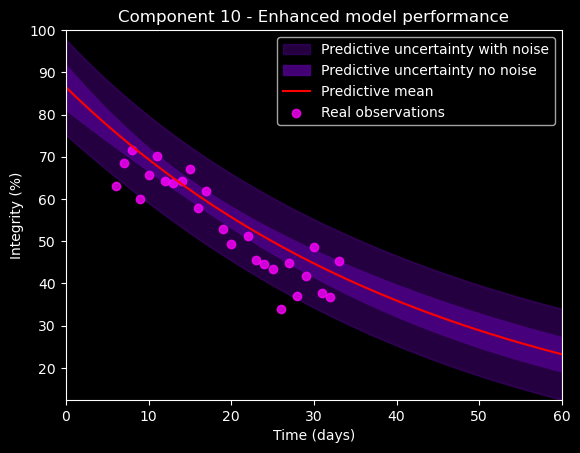

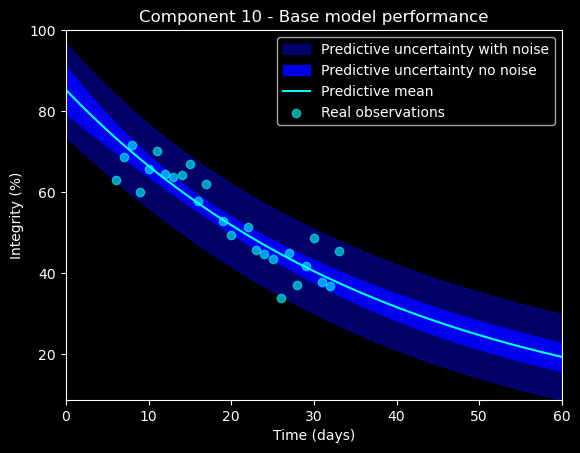

[2.0 4.0 20.0 38.0]


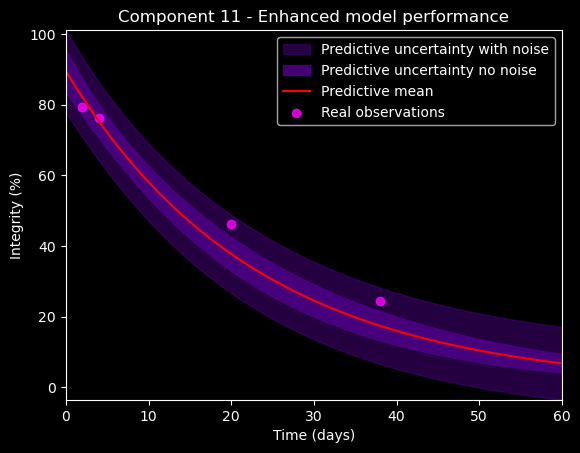

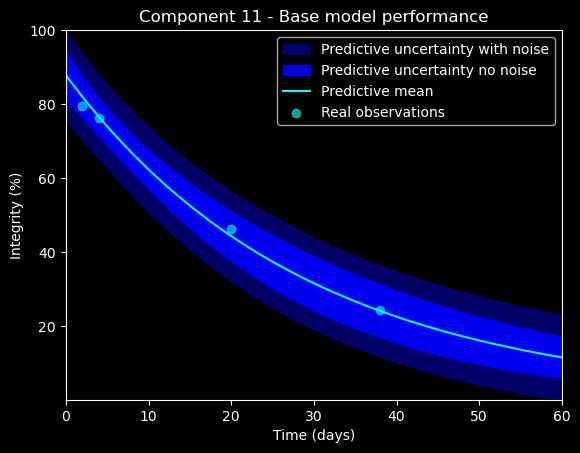

[2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 11.0 12.0 13.0 14.0 15.0 16.0 17.0 18.0
 19.0 20.0 21.0 22.0 23.0 24.0 25.0 26.0]


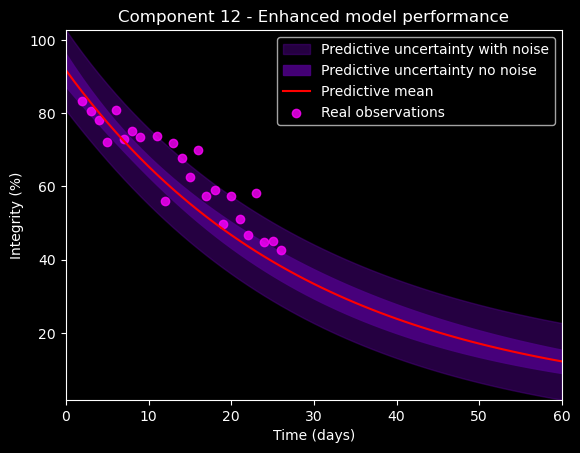

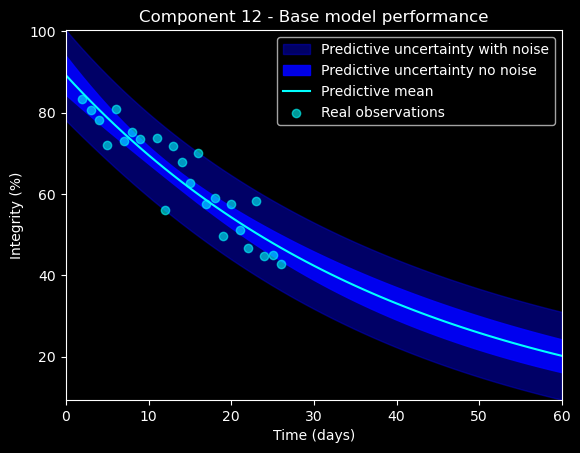

[6.0 10.0 13.0 15.0 18.0 21.0 23.0]


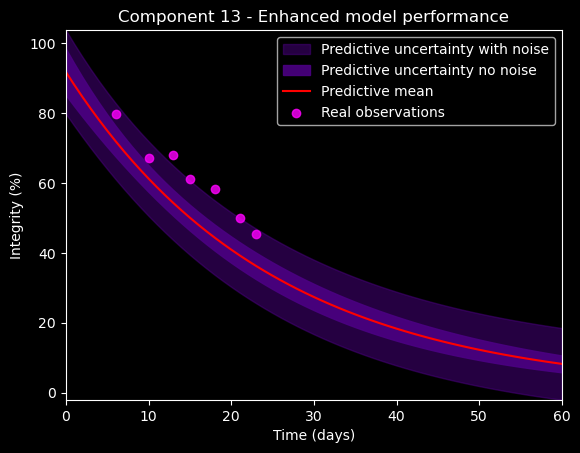

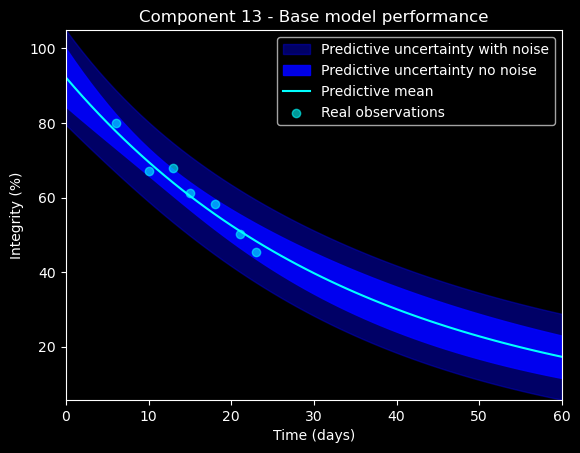

[2.0 3.0 7.0 9.0 15.0 18.0 20.0 22.0 24.0 25.0 28.0 37.0 38.0]


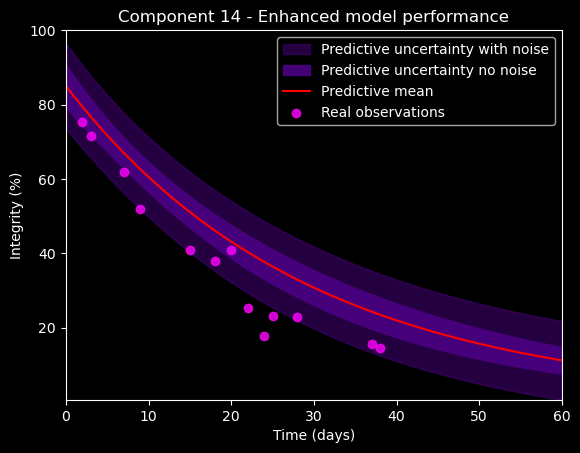

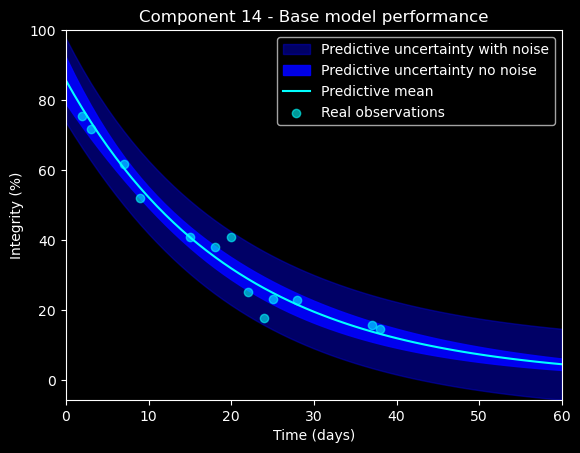

[0.0 1.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 11.0 13.0 14.0 15.0 16.0 17.0 18.0
 19.0 20.0 21.0 22.0 23.0 24.0 25.0 26.0 28.0 29.0 30.0 31.0 32.0 33.0
 34.0 35.0 36.0 37.0 38.0 39.0]


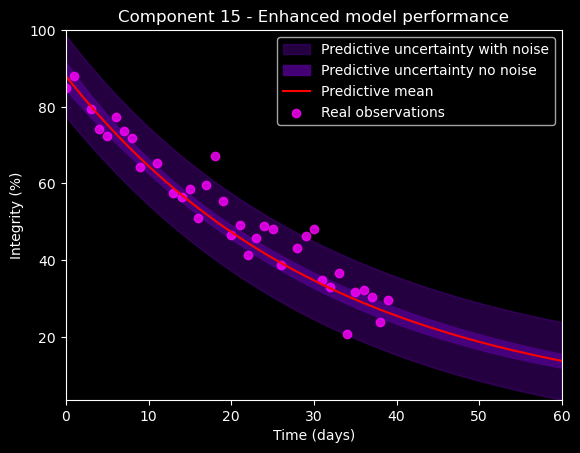

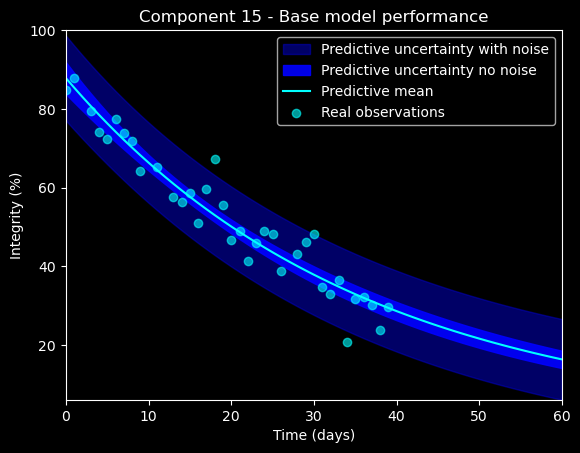

[4.0 6.0 10.0 18.0 20.0 21.0 24.0 27.0 32.0]


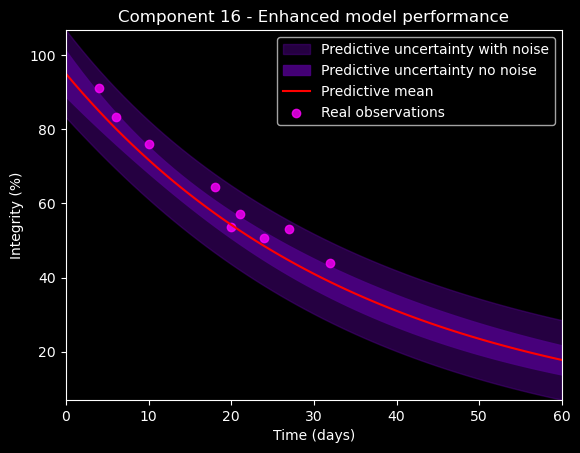

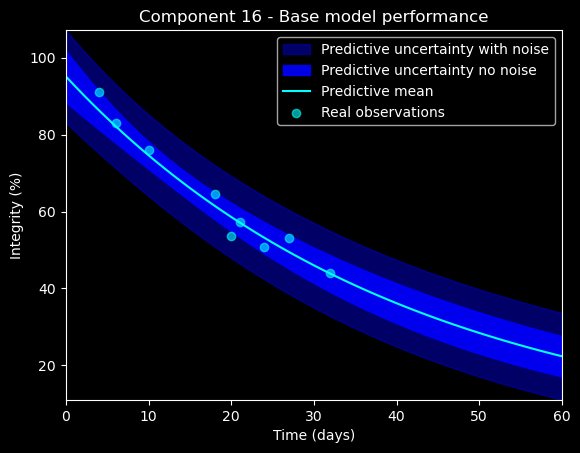

[0.0 3.0 4.0 5.0 6.0 7.0 8.0 10.0 12.0 14.0 16.0 17.0 19.0 23.0]


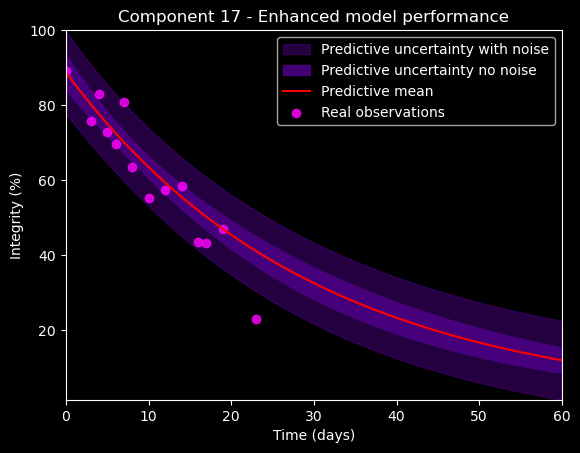

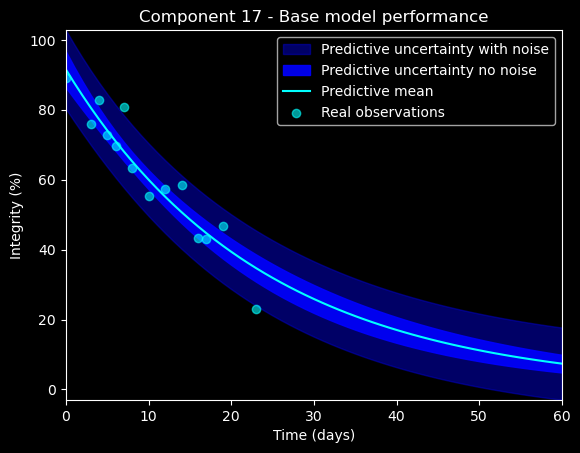

[0.0 2.0 4.0 6.0 7.0 9.0 10.0 12.0]


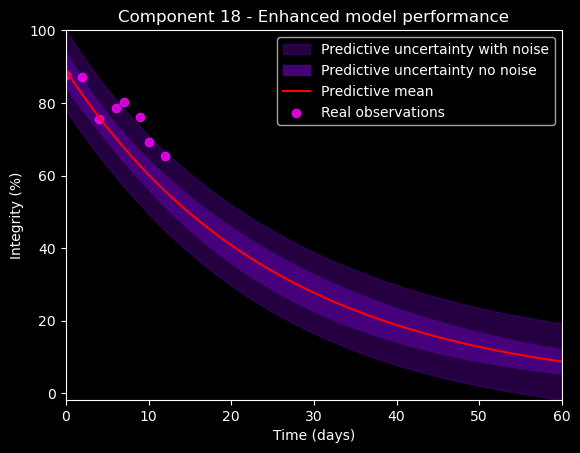

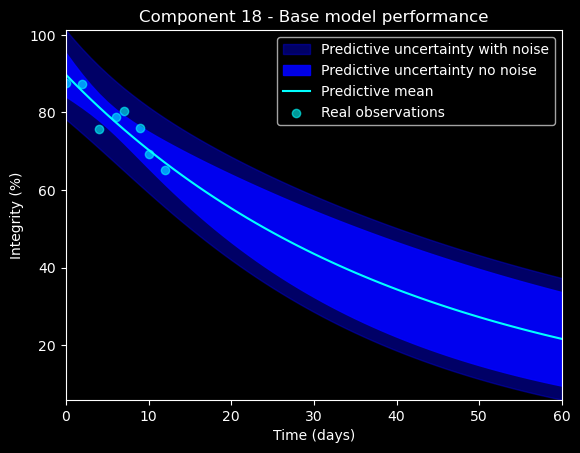

[0.0 1.0 3.0 8.0 10.0 13.0 14.0 21.0 23.0 24.0 26.0 28.0 29.0 32.0 35.0
 36.0 39.0]


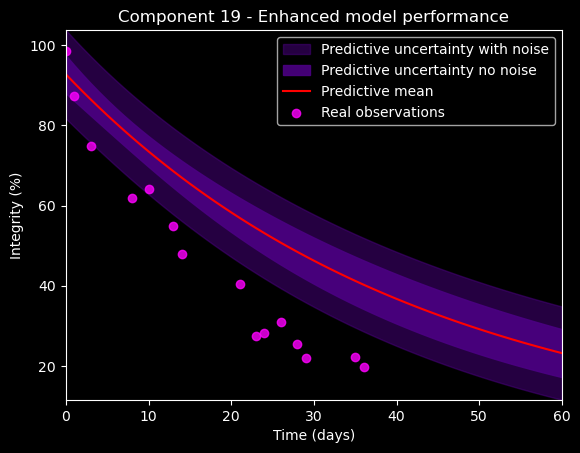

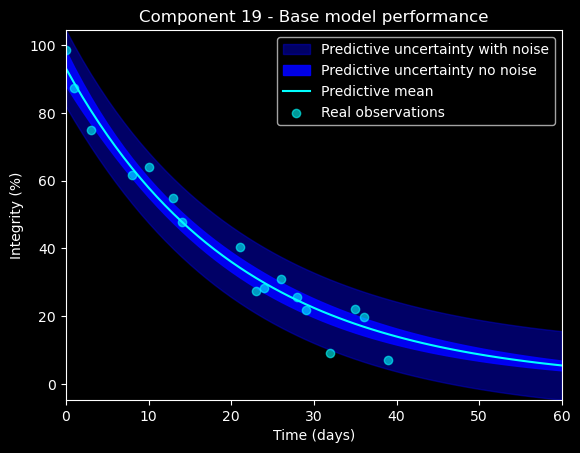

[0.0 1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0
 16.0 17.0 18.0 19.0 20.0 21.0 22.0 23.0 24.0 25.0 26.0 27.0 28.0 29.0
 30.0 31.0 32.0 33.0 34.0 35.0 36.0 37.0]


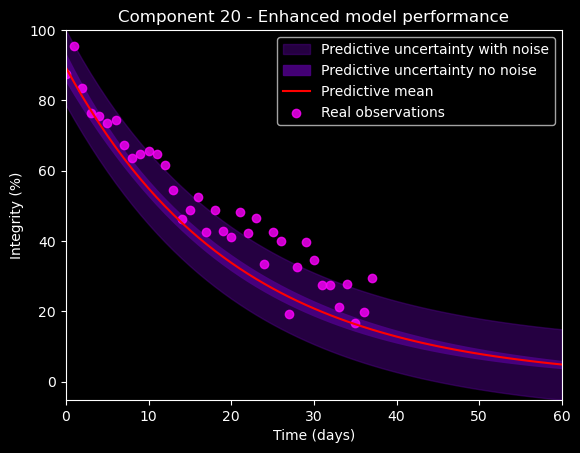

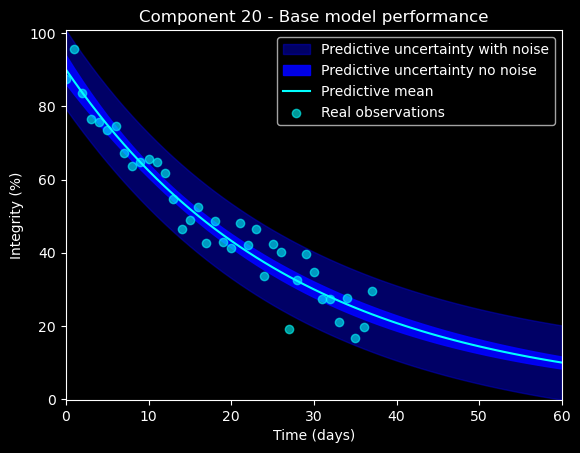

[5.0]


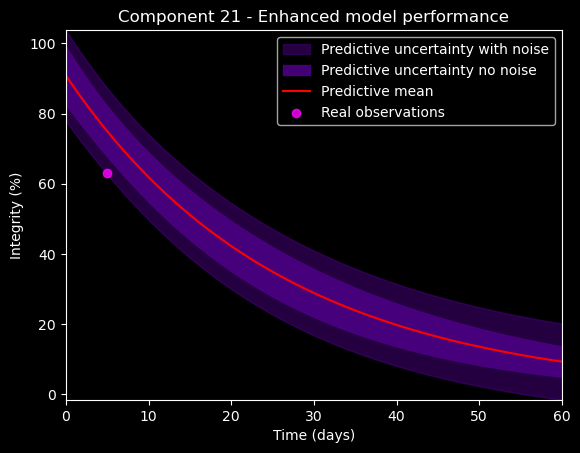

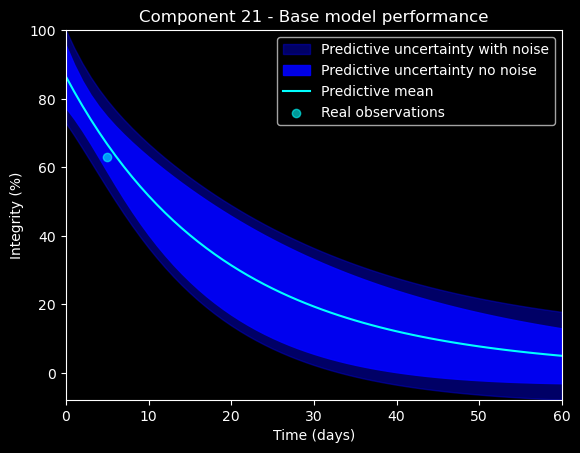

[5.0 6.0 7.0 8.0 10.0 11.0 13.0 14.0 17.0]


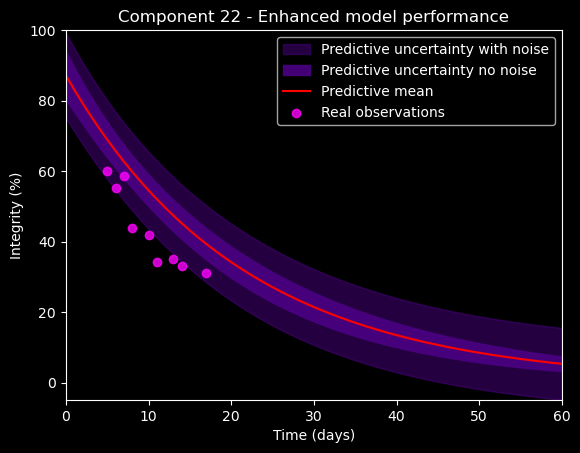

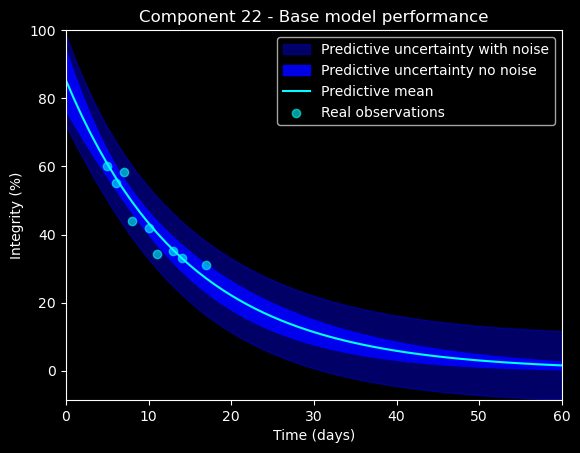

[0.0 5.0 6.0 11.0 15.0 20.0 22.0 23.0]


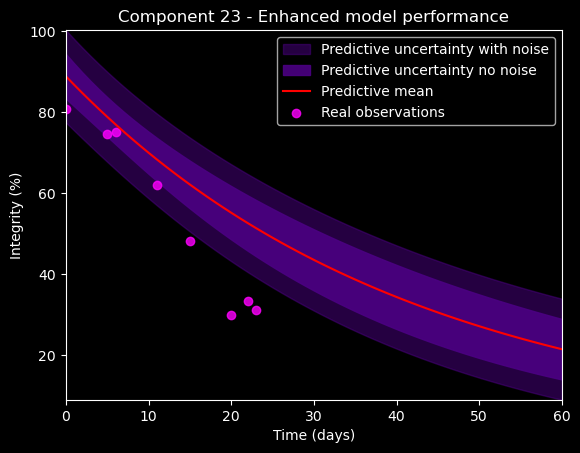

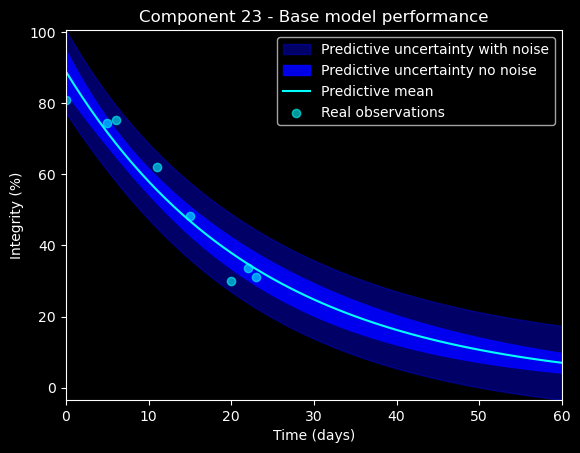

[1.0]


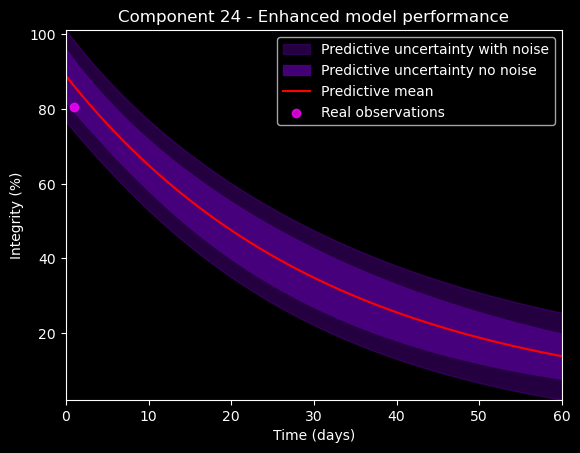

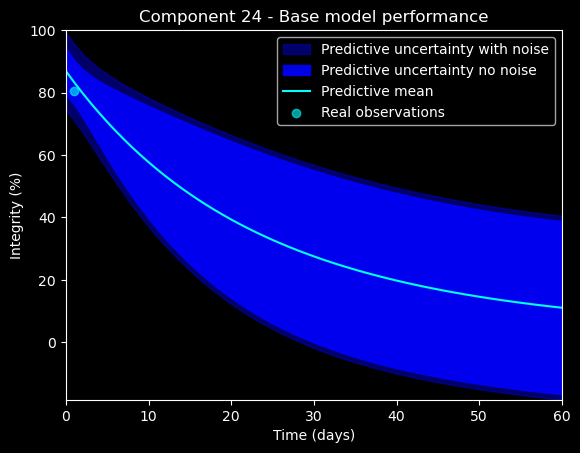

[4.0 6.0 7.0 10.0 11.0 12.0 16.0 17.0 18.0 22.0 23.0 24.0 25.0 28.0 29.0
 33.0 35.0 37.0 38.0]


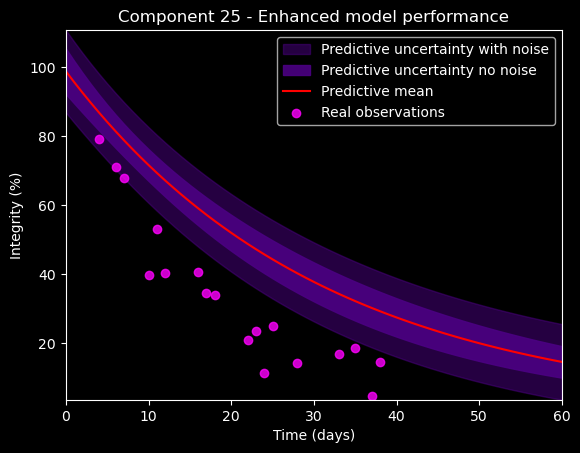

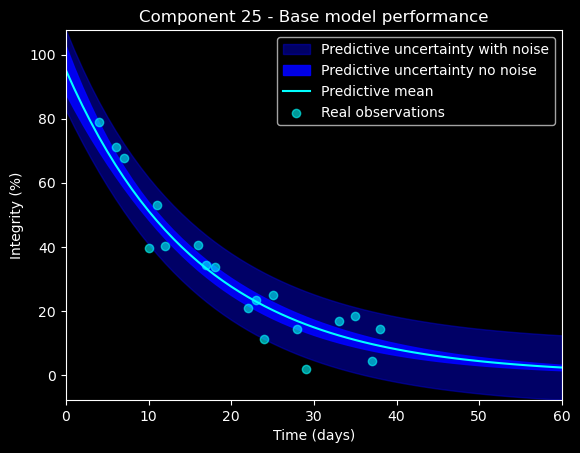

[2.0 4.0]


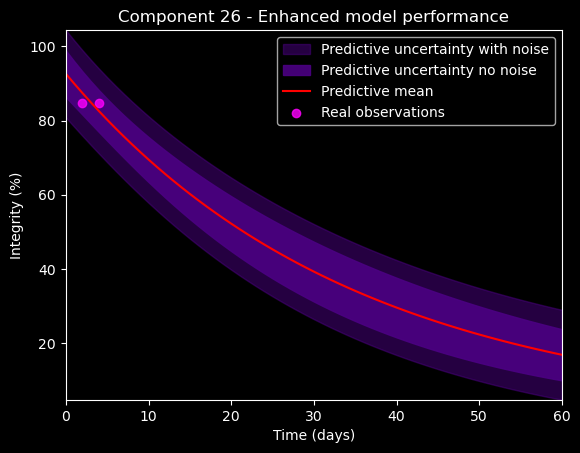

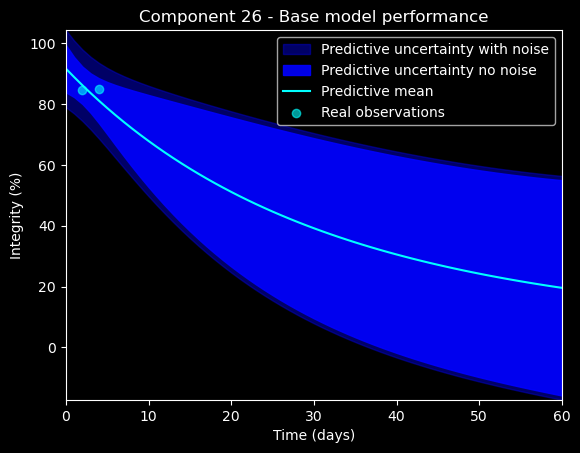

[0.0 1.0 2.0 3.0 5.0 7.0 9.0 10.0 12.0 14.0 15.0 17.0 18.0 19.0 20.0 21.0
 22.0 24.0 26.0 27.0 28.0 29.0 30.0 31.0 32.0 33.0 35.0]


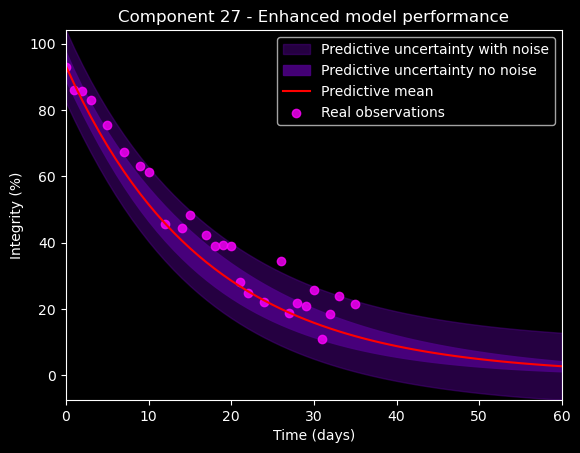

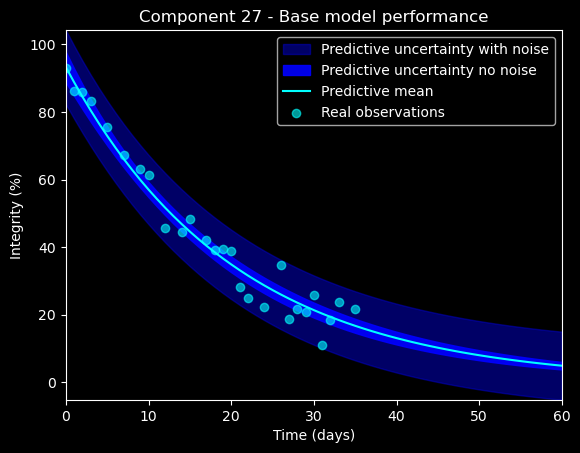

[4.0 7.0 8.0 9.0 10.0 11.0 12.0]


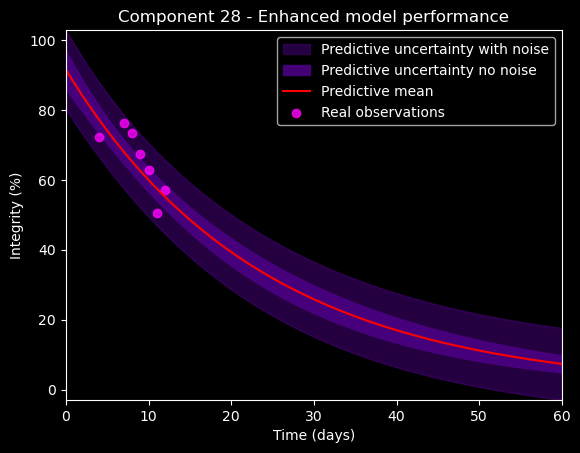

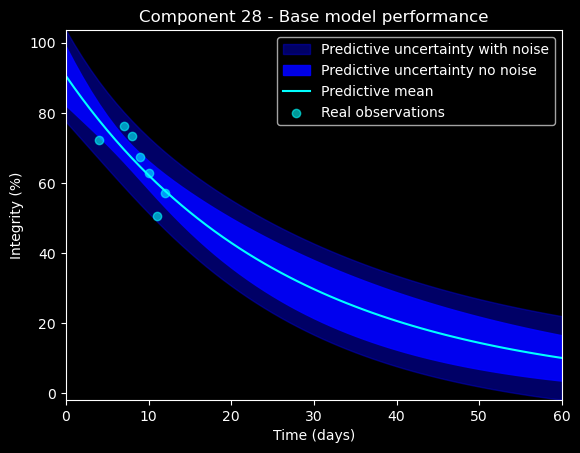

[5.0 6.0 8.0 9.0 11.0 12.0 14.0 15.0]


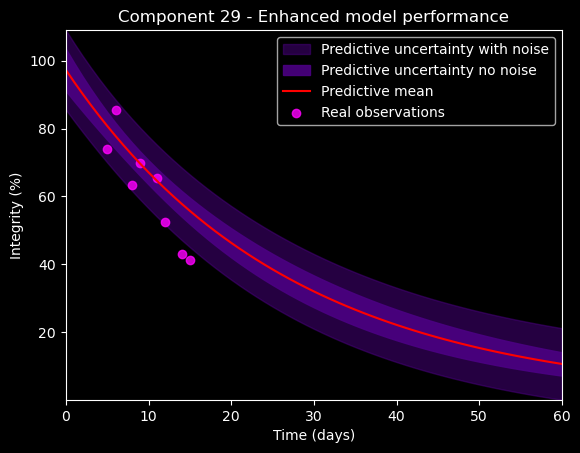

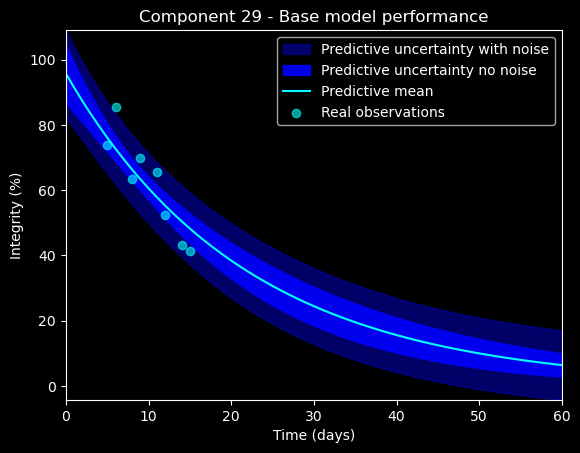

[2.0 11.0 13.0]


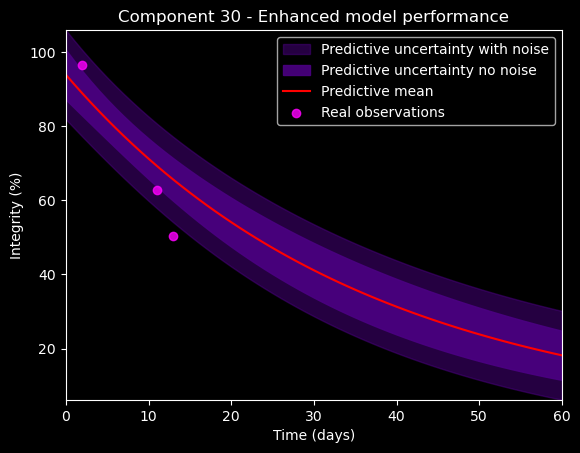

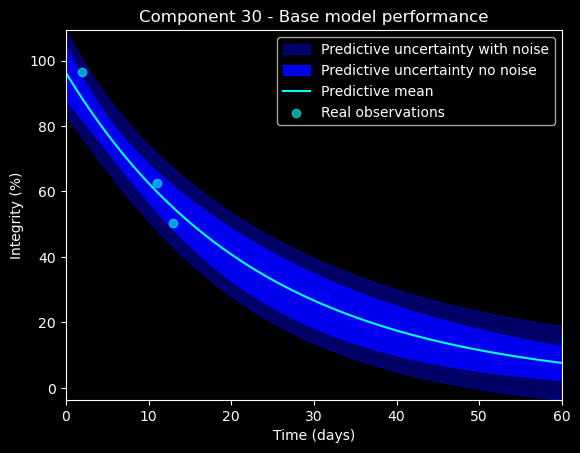

[5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0 16.0 17.0]


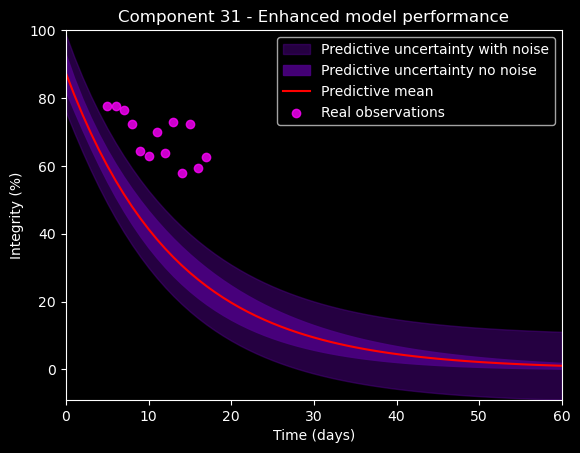

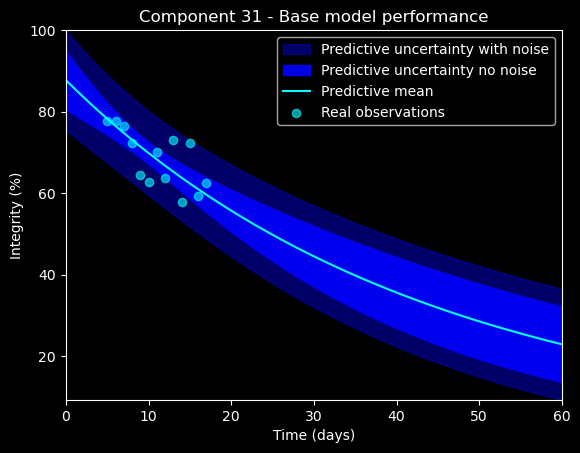

[3.0 9.0]


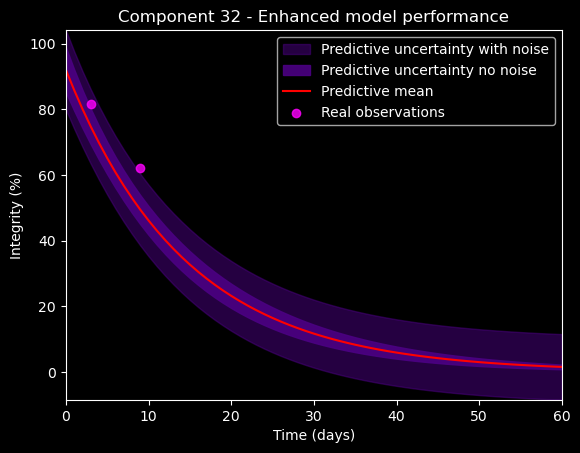

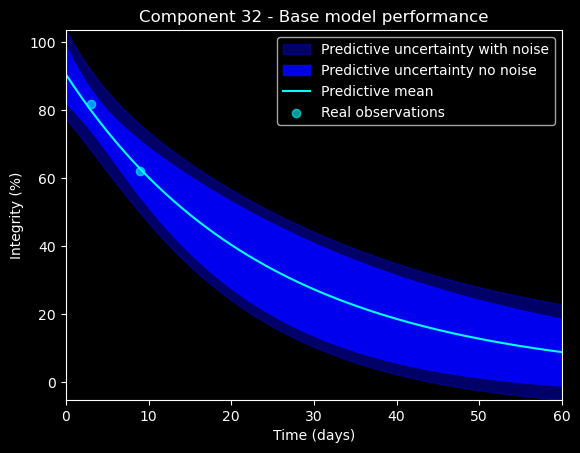

[1.0 3.0 5.0 6.0 9.0 15.0 19.0 20.0 21.0 23.0 25.0 27.0 28.0 30.0 31.0
 33.0 35.0]


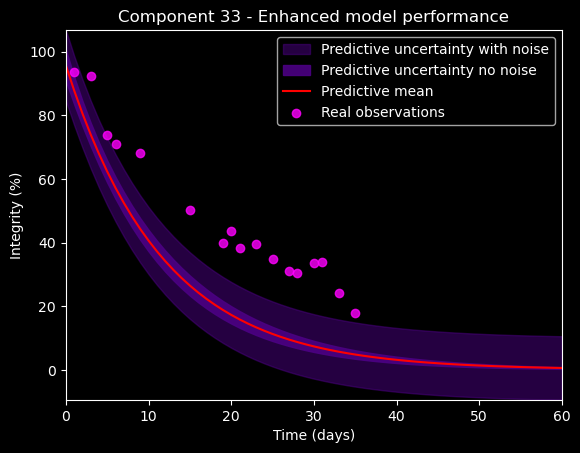

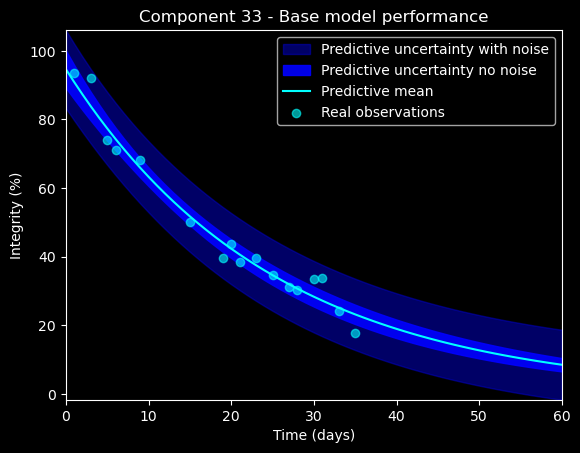

[2.0 6.0 9.0]


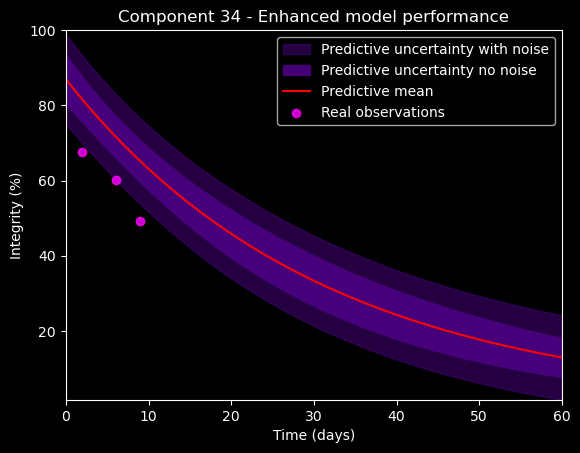

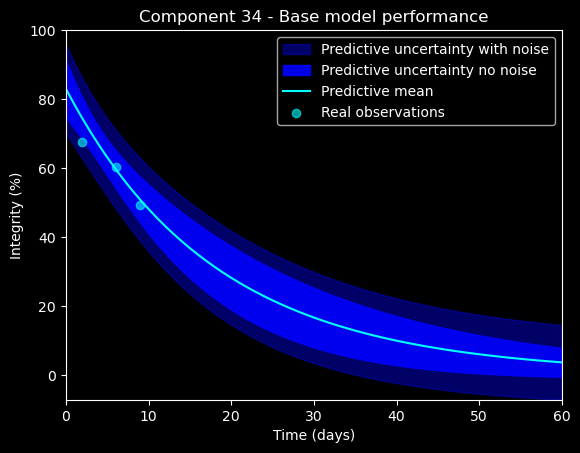

[0.0 1.0 5.0 7.0 10.0 14.0 20.0 21.0 22.0 24.0 25.0 26.0 28.0 30.0 31.0
 32.0 33.0 35.0 40.0]


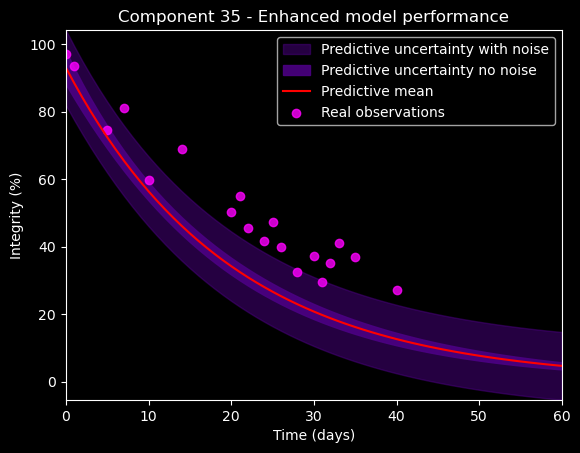

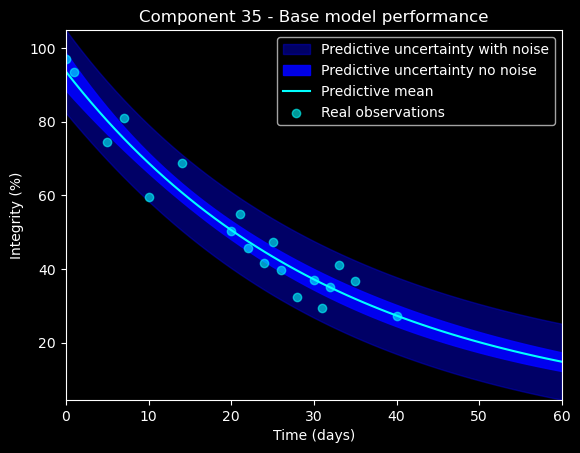

[2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0 16.0 17.0
 18.0 19.0 20.0 21.0 23.0 24.0 25.0 26.0 28.0 29.0 30.0 31.0 32.0 33.0
 34.0 35.0 36.0]


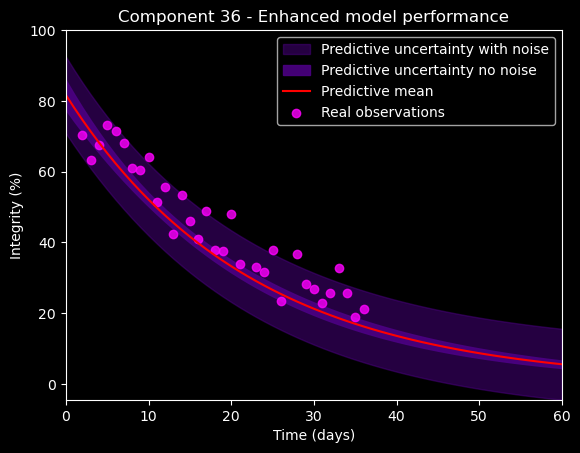

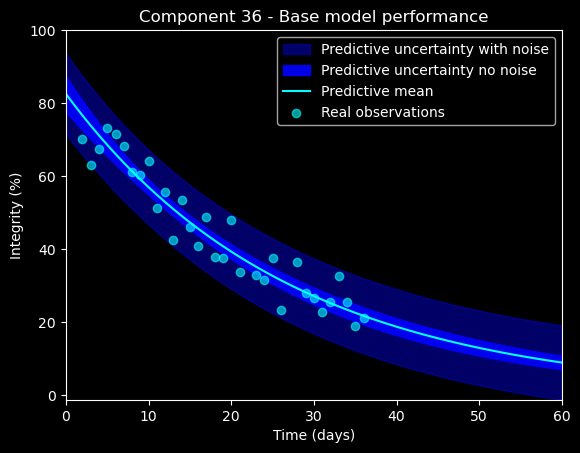

[3.0 4.0 5.0 6.0 7.0 8.0 9.0 11.0 12.0 13.0 14.0 15.0 16.0 17.0 18.0 19.0
 20.0 21.0 22.0 23.0 24.0 26.0 27.0 30.0 31.0 32.0 33.0 34.0 35.0 36.0
 37.0]


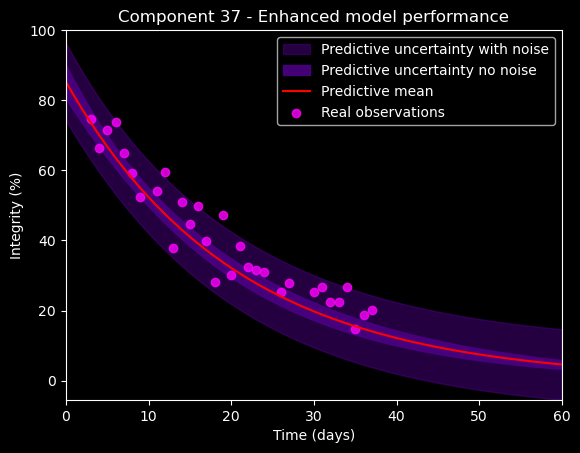

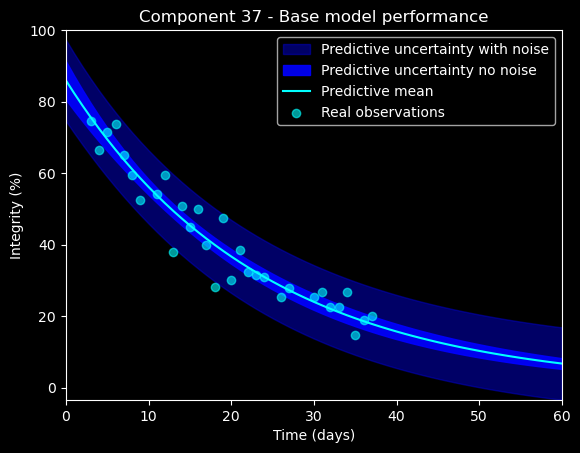

[5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0 14.0 15.0 17.0 18.0 19.0 20.0 21.0
 22.0 23.0 25.0 26.0 27.0 28.0 30.0 31.0 32.0 33.0 34.0 35.0 36.0 37.0
 38.0 39.0 40.0 42.0 43.0]


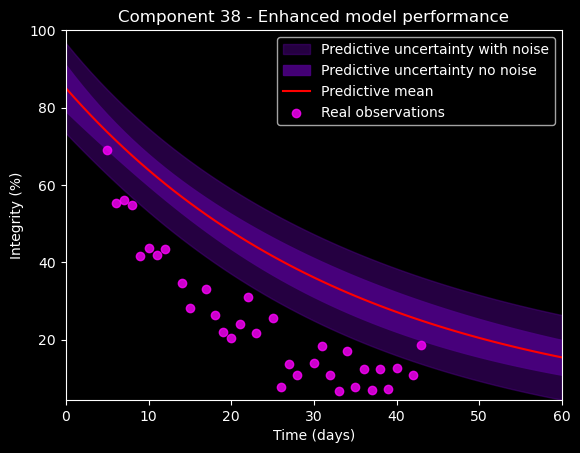

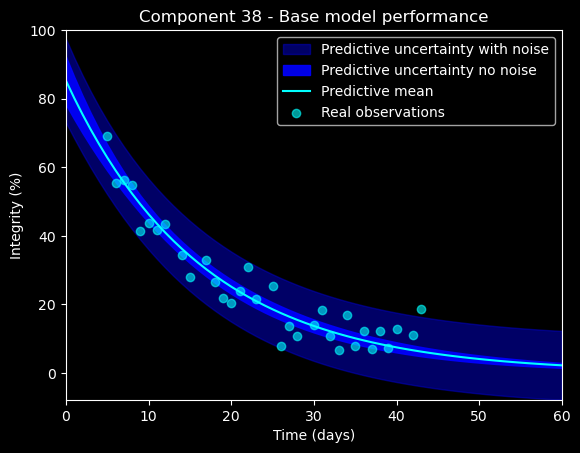

[0.0 1.0 7.0 9.0 10.0 13.0 21.0 26.0 30.0 31.0 32.0 34.0 38.0 39.0]


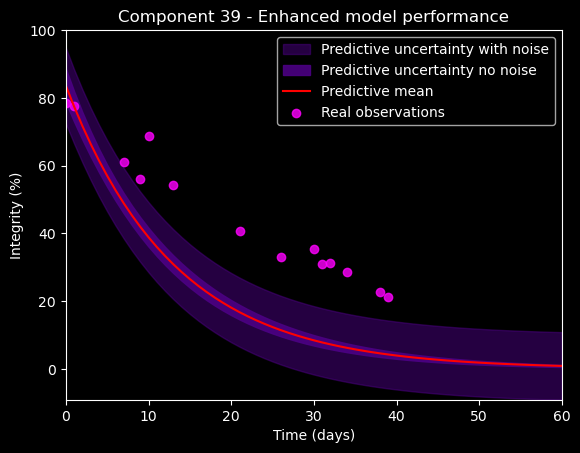

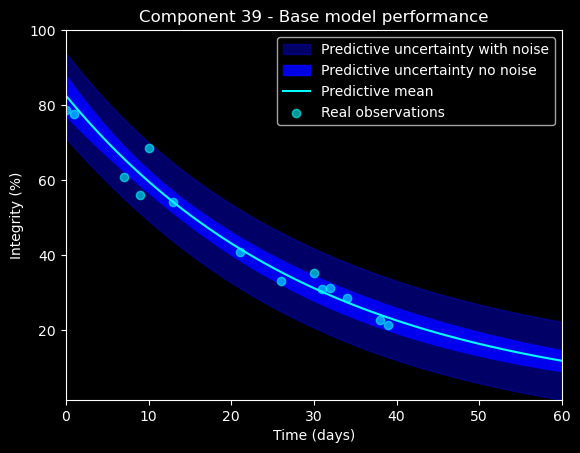

[2.0 4.0 6.0 7.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0 16.0 17.0 18.0 19.0
 20.0 21.0 22.0 23.0 25.0 26.0 27.0 28.0 29.0 30.0 32.0 33.0 34.0 35.0]


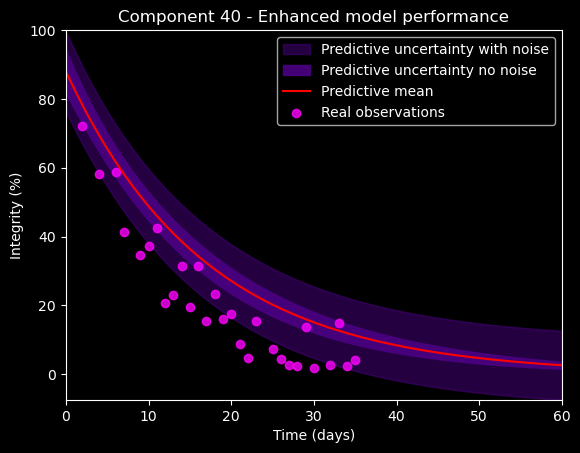

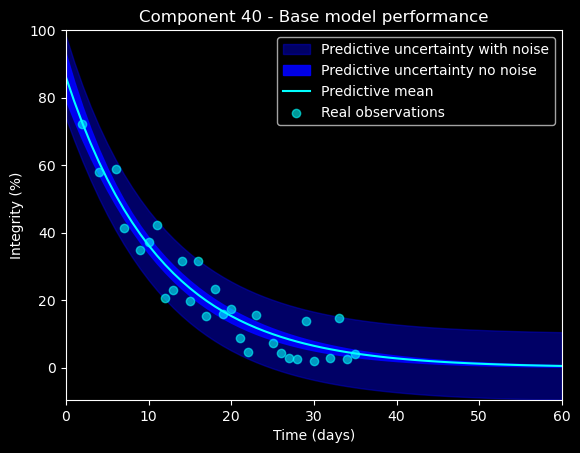

[1.0 36.0]


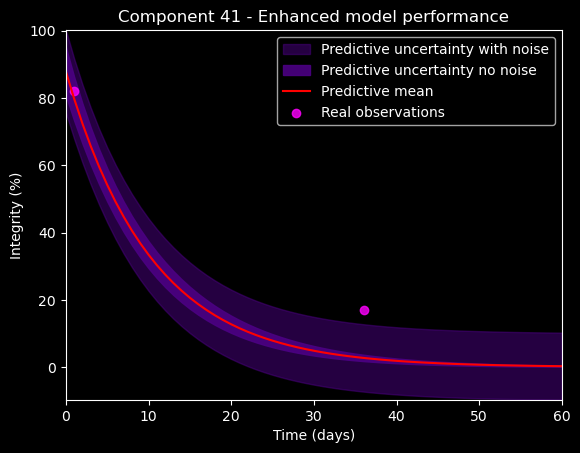

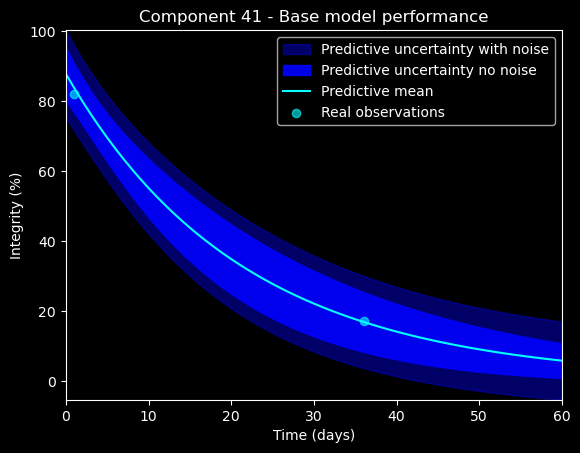

[0.0 2.0 3.0 4.0 5.0 6.0 7.0 10.0 11.0 13.0 14.0 15.0 16.0 17.0 18.0 20.0
 22.0 24.0 25.0 26.0 27.0 28.0 29.0 30.0 32.0 33.0 34.0 36.0]


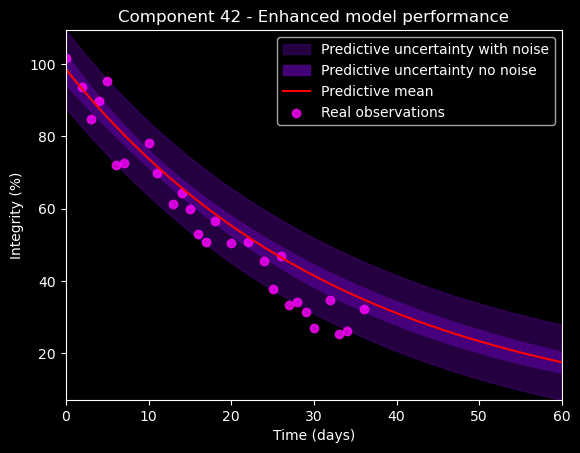

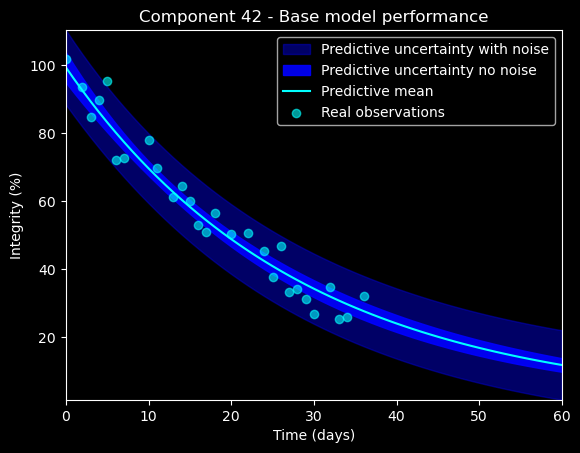

[0.0 1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0
 16.0 17.0 18.0 19.0 20.0 21.0 22.0 23.0 24.0 25.0 26.0 27.0 28.0 29.0
 30.0 31.0 32.0 33.0 34.0 35.0 36.0 37.0 38.0 39.0 40.0]


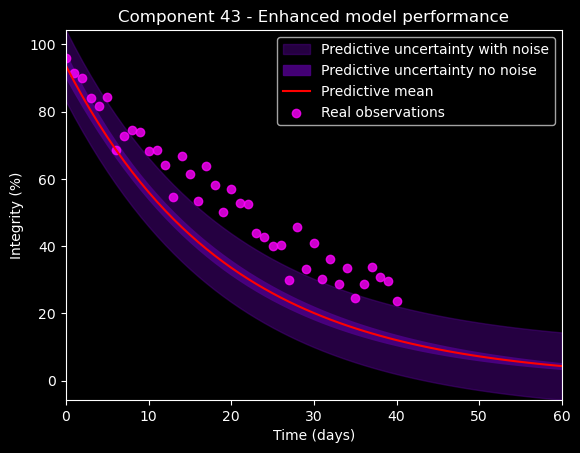

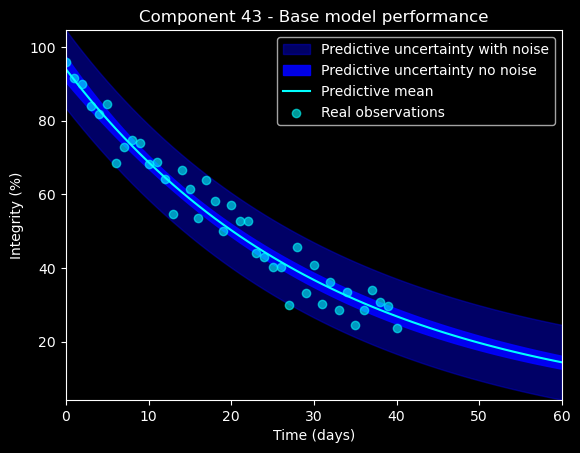

[0.0 2.0 5.0 7.0 11.0 18.0 21.0 24.0]


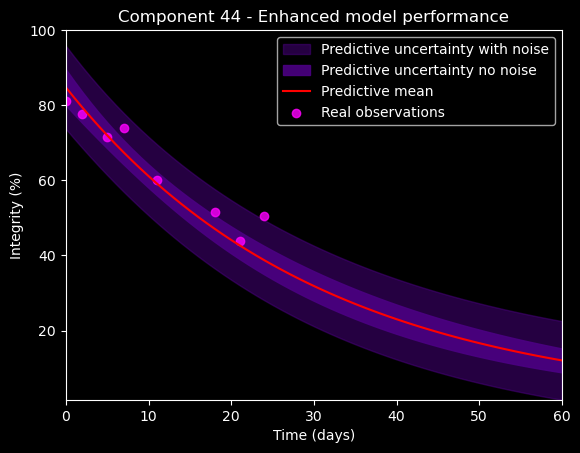

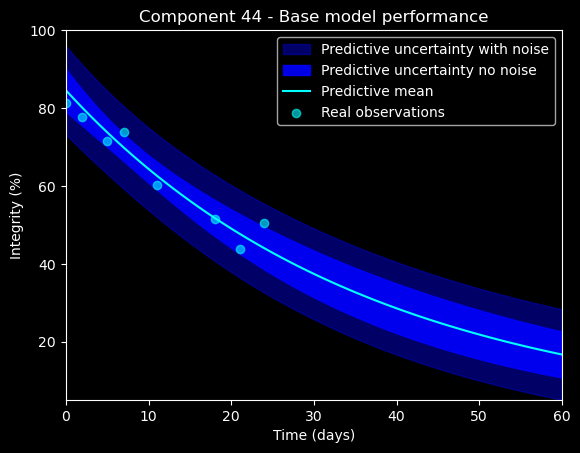

[4.0 5.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 14.0 15.0 16.0 17.0 18.0 19.0
 20.0 21.0 22.0 23.0 24.0 25.0 26.0 27.0 28.0 29.0 30.0 31.0]


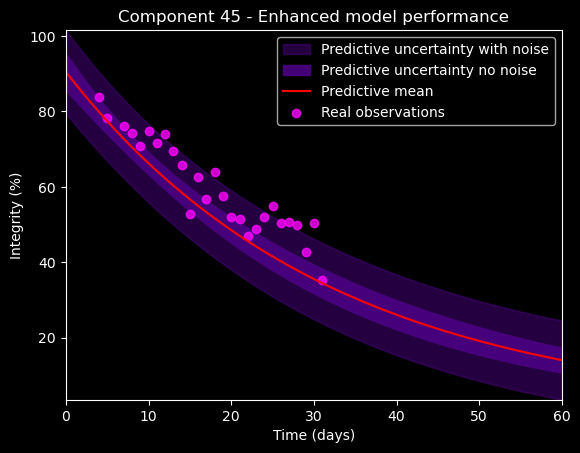

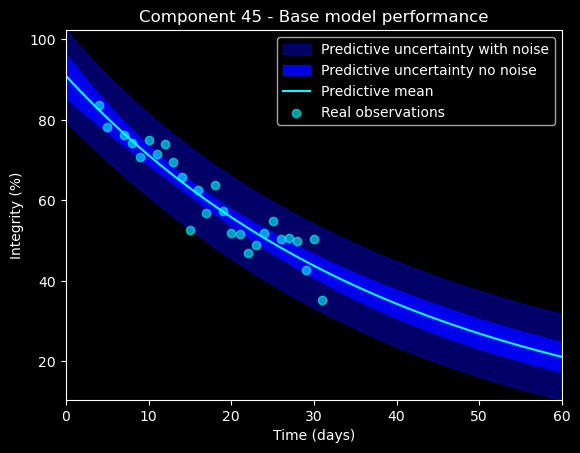

[1.0 2.0 4.0 5.0 7.0 8.0 9.0 10.0 11.0 12.0 13.0 15.0 16.0 17.0 18.0 19.0
 20.0 21.0 22.0 23.0 24.0 25.0 26.0 27.0 28.0 29.0 31.0 32.0 33.0]


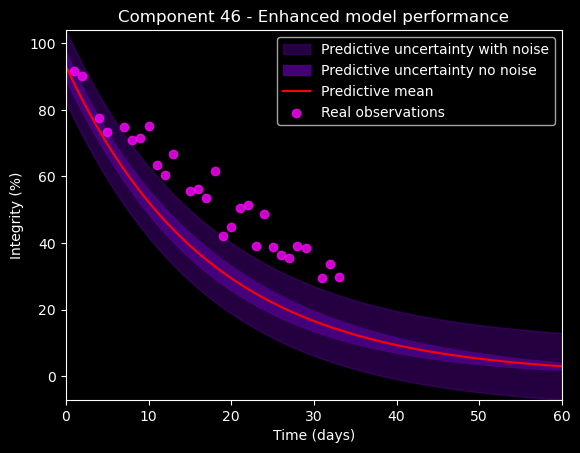

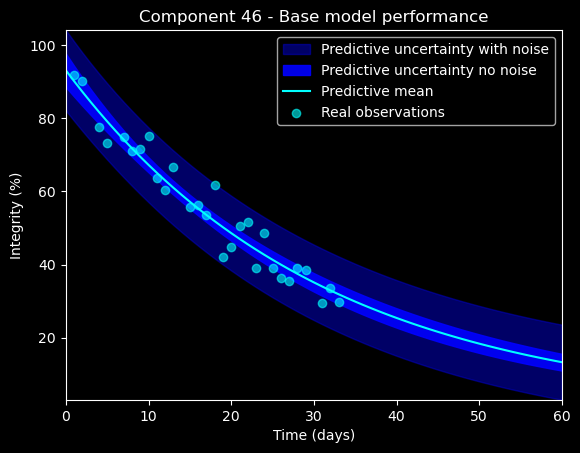

[2.0 4.0 5.0 6.0 7.0 8.0 9.0 11.0 13.0 14.0 15.0]


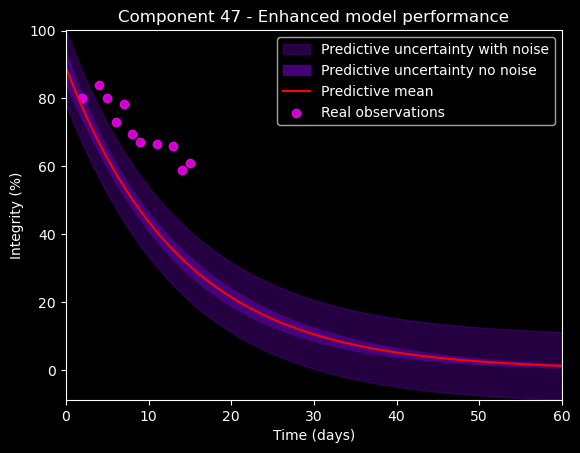

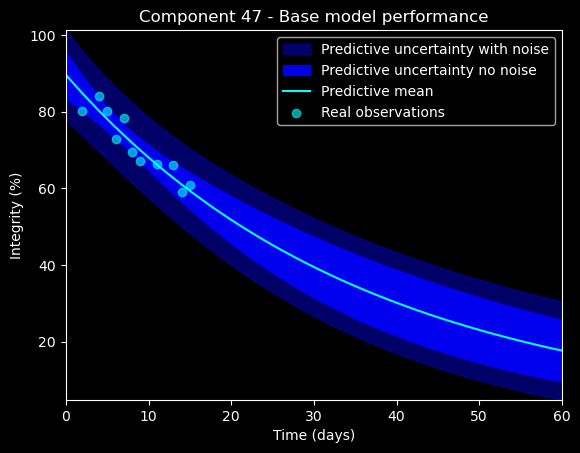

[3.0 4.0 5.0 6.0 7.0 11.0 12.0 13.0 14.0 15.0 17.0 18.0 21.0 27.0 28.0
 30.0 33.0 34.0 35.0]


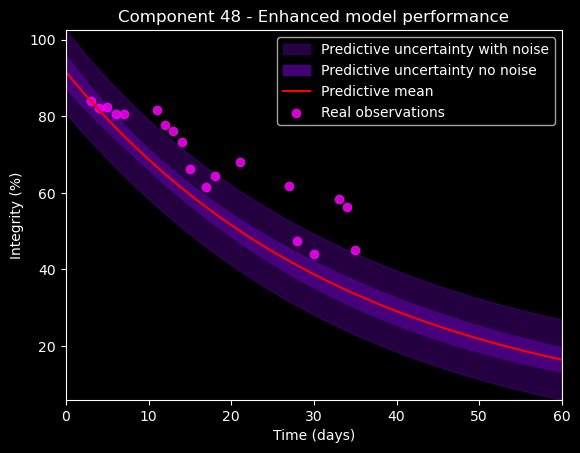

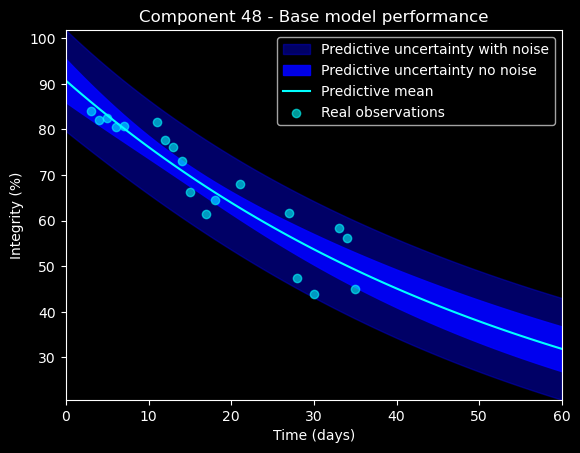

[5.0 9.0 12.0 25.0 27.0 31.0 39.0 40.0]


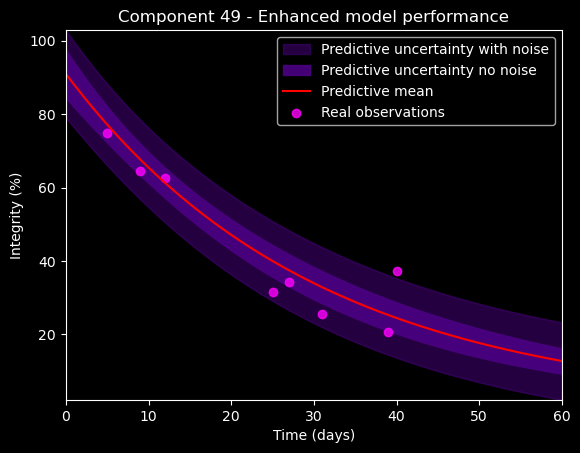

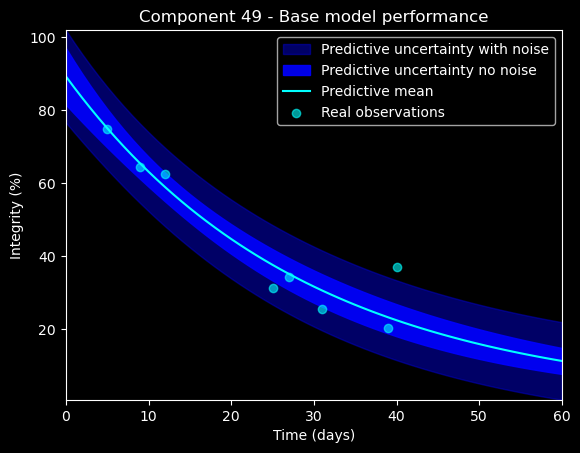

[3.0 5.0 6.0 8.0]


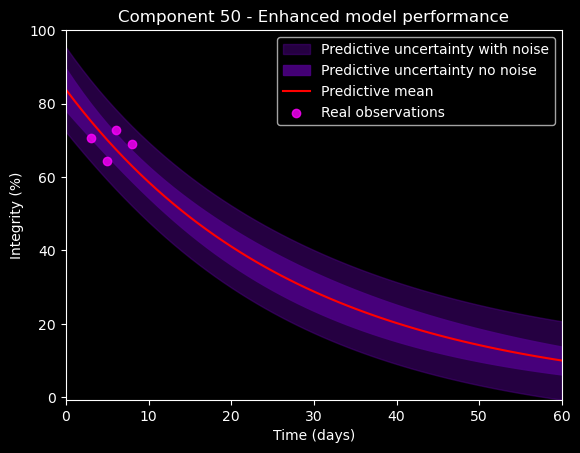

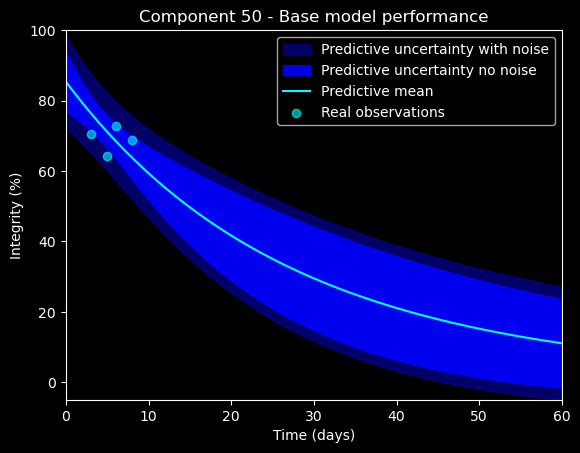

[5.0 6.0 8.0 9.0]


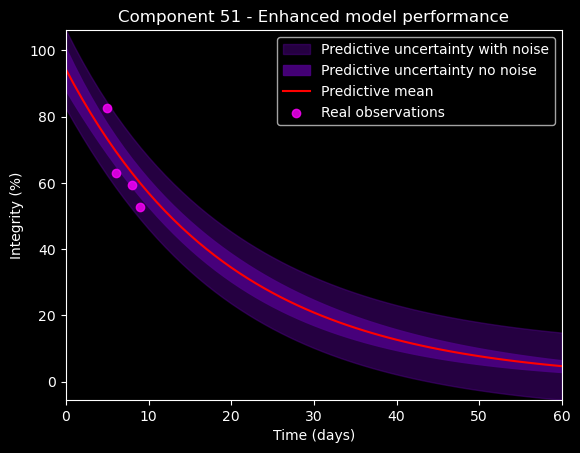

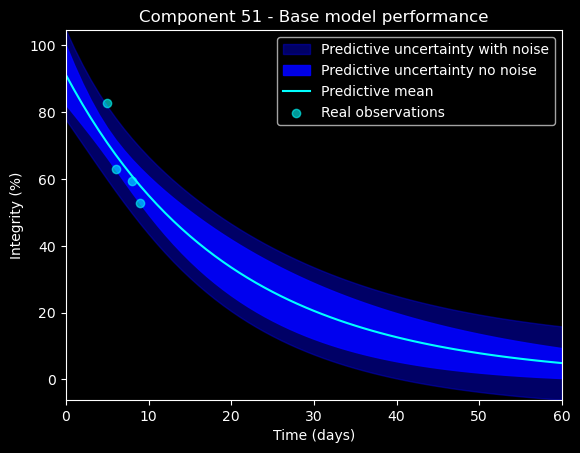

[4.0 6.0 7.0 9.0]


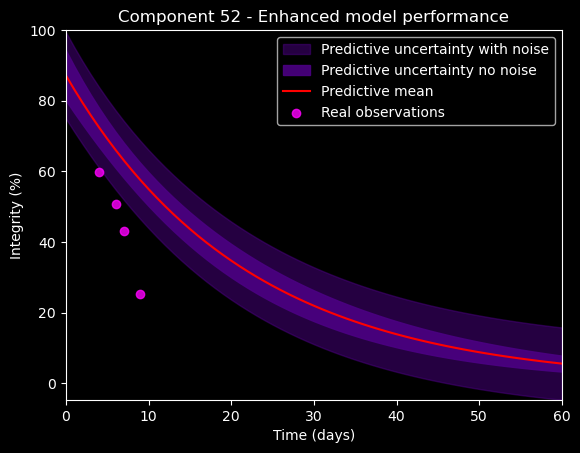

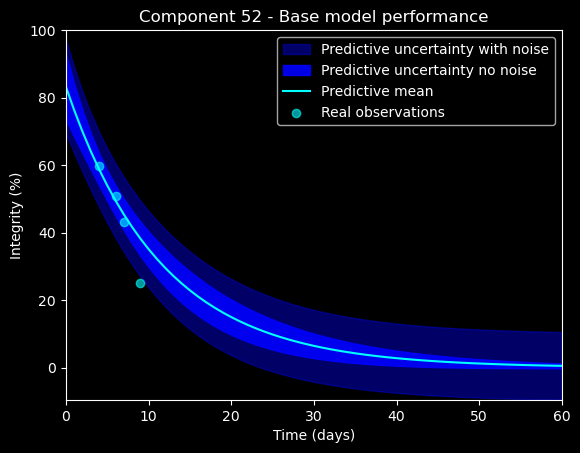

[5.0 6.0 7.0 8.0 9.0]


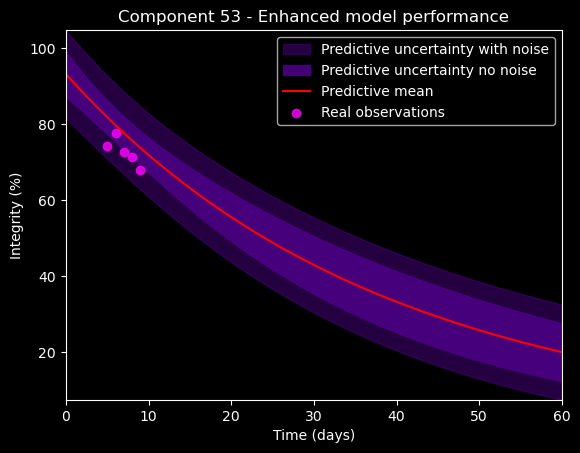

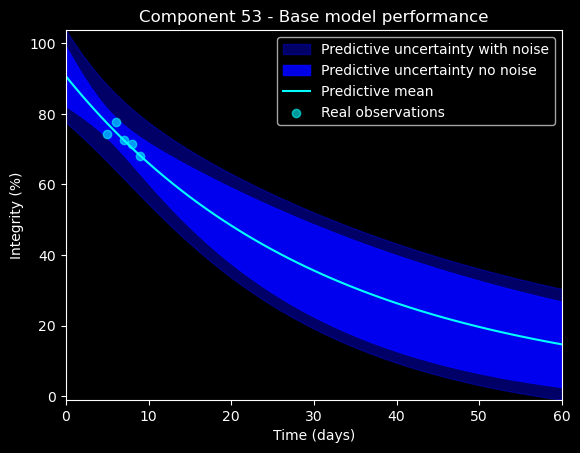

[5.0 6.0 9.0]


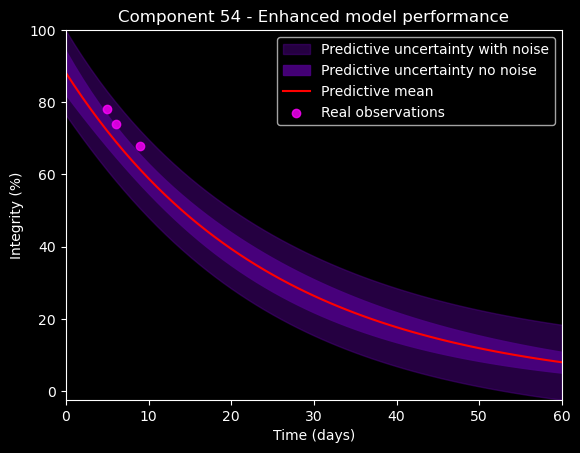

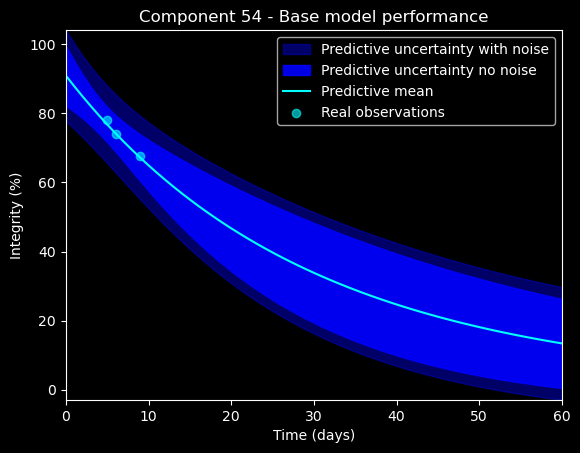

[0.0]


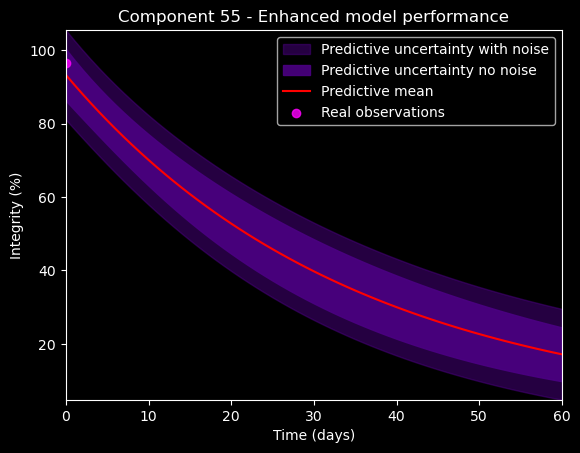

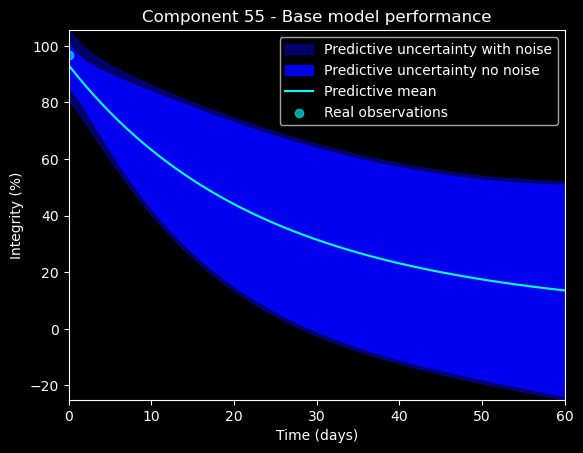

[3.0 5.0 7.0 8.0 9.0]


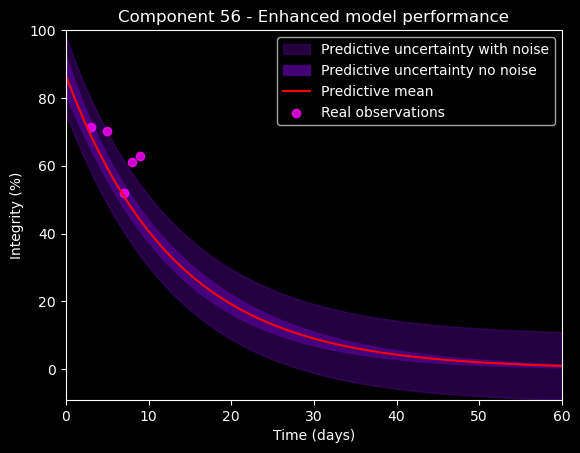

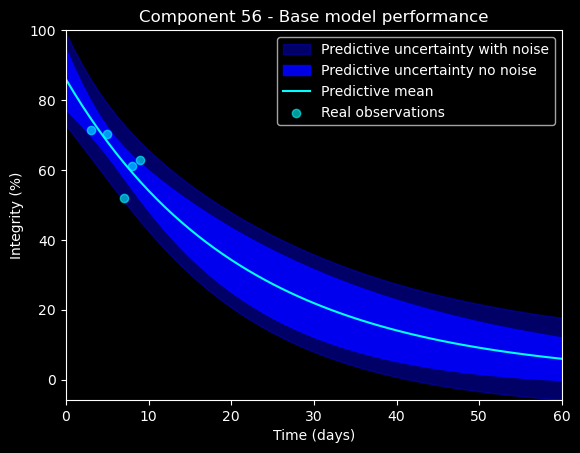

[5.0 6.0 7.0 8.0]


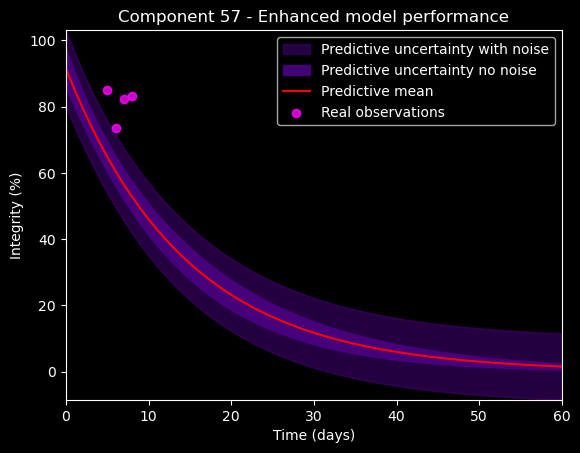

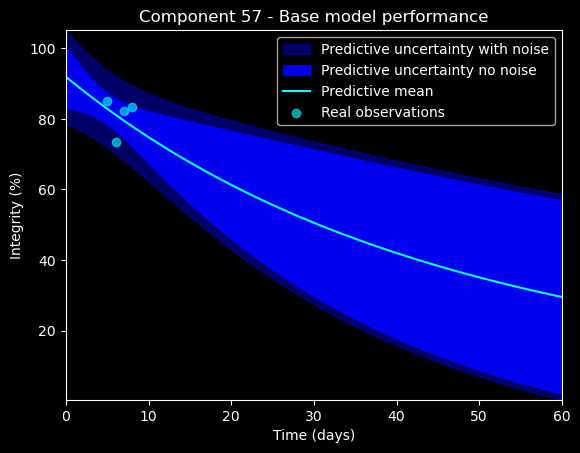

[5.0 6.0]


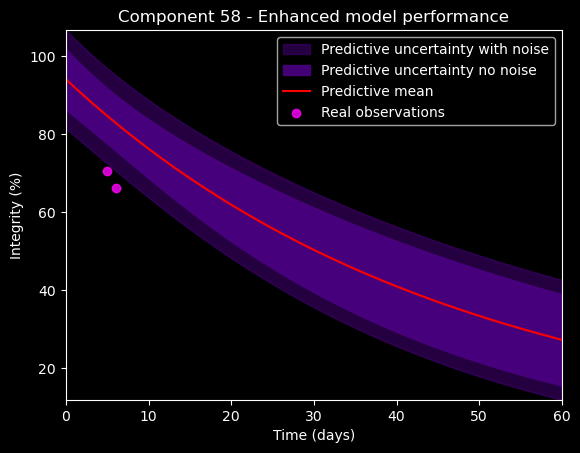

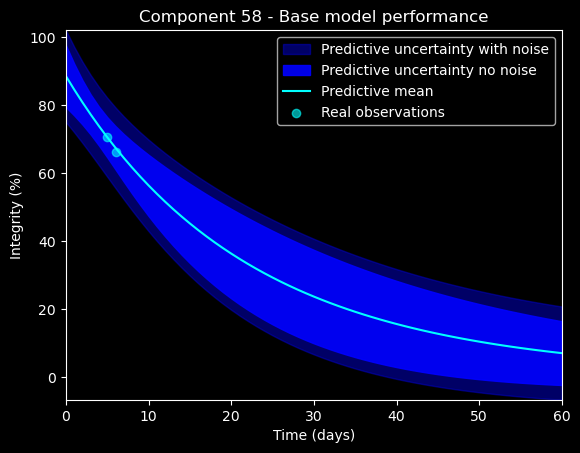

[5.0 9.0]


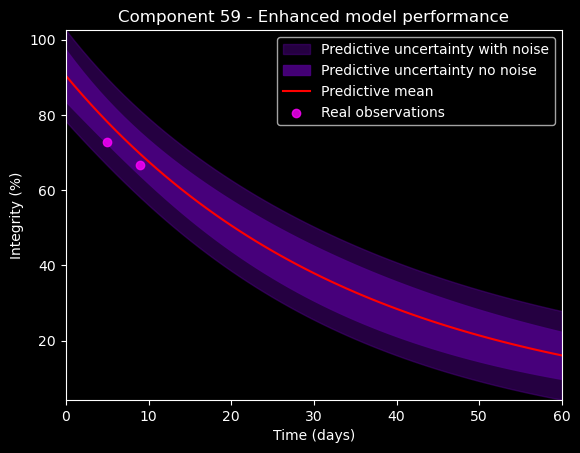

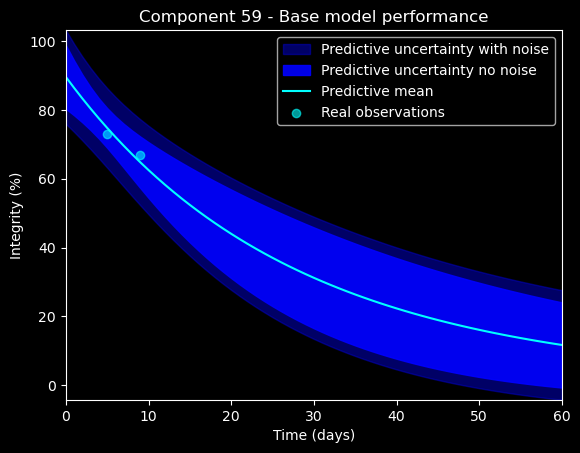

[3.0]


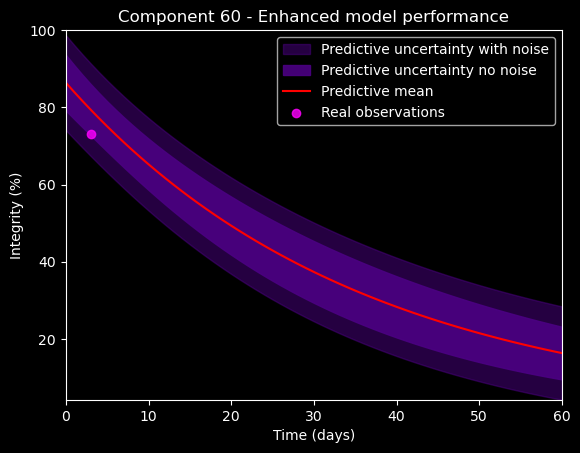

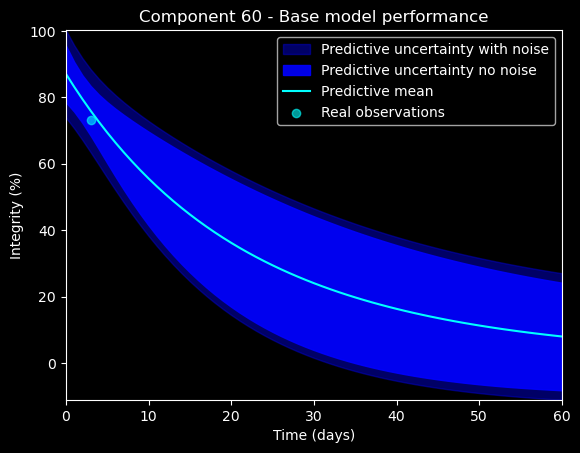

[5.0 6.0 8.0]


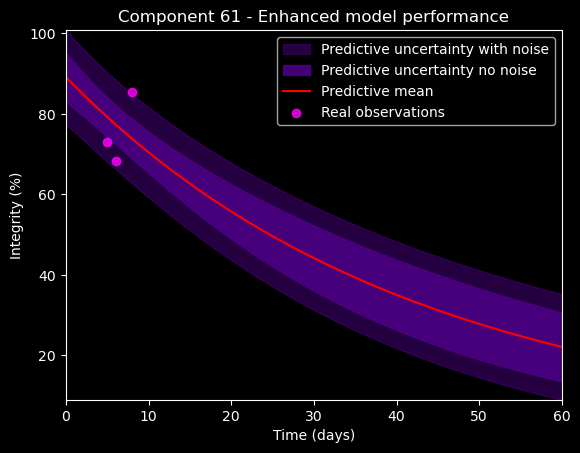

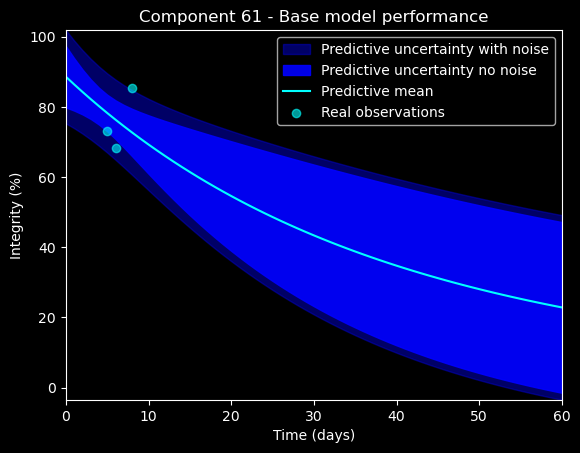

[6.0]


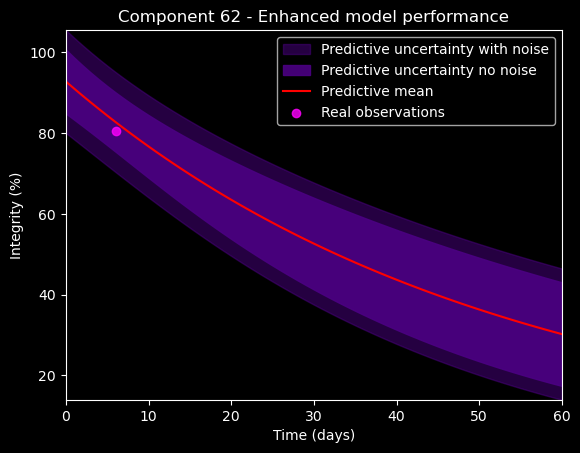

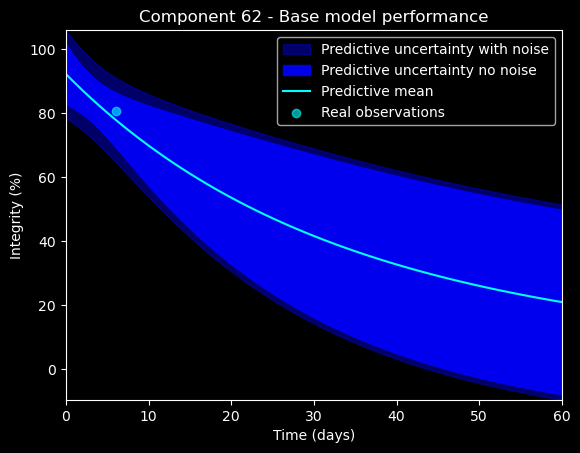

[3.0 4.0 8.0 9.0]


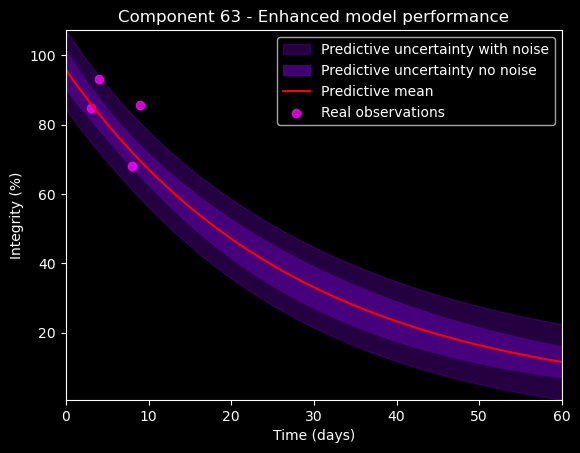

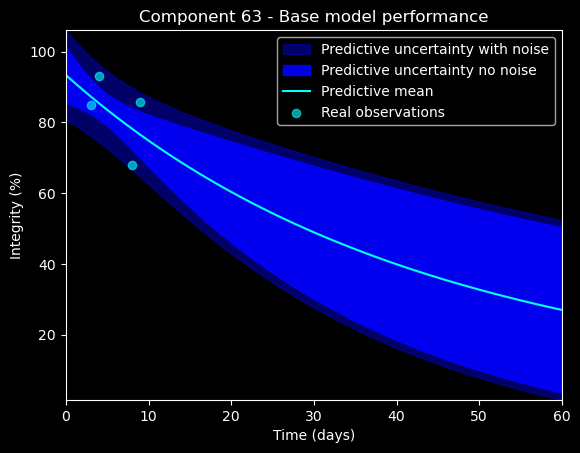

[2.0 3.0 4.0 5.0 7.0 9.0]


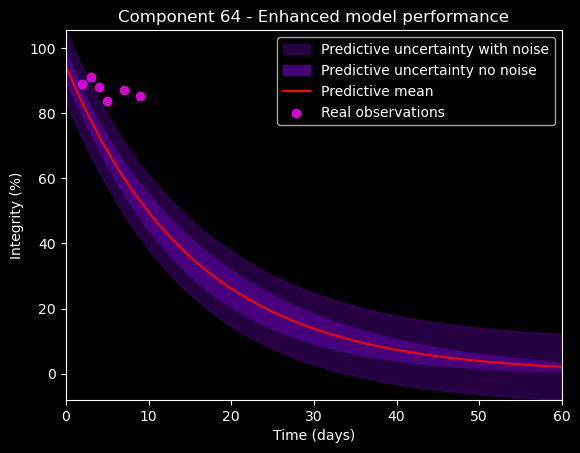

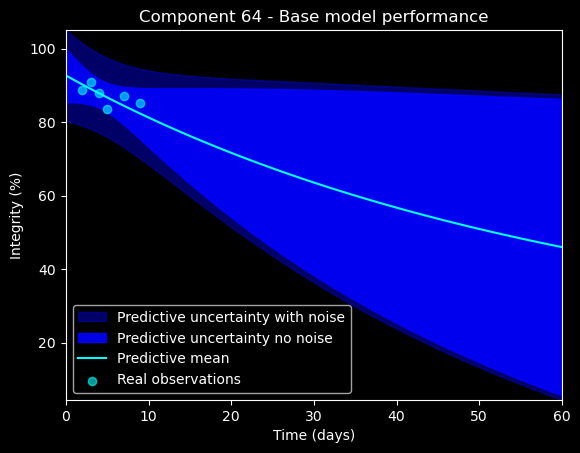

[5.0]


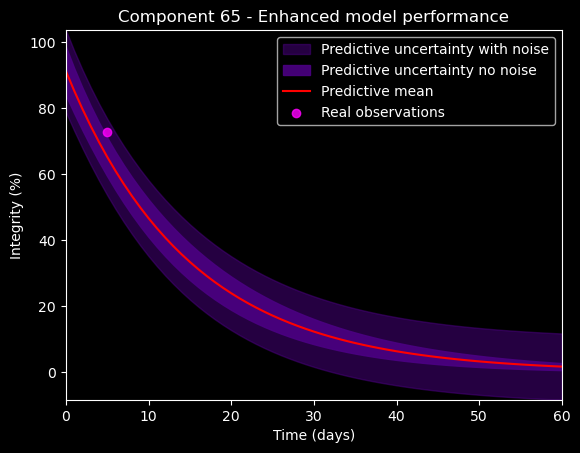

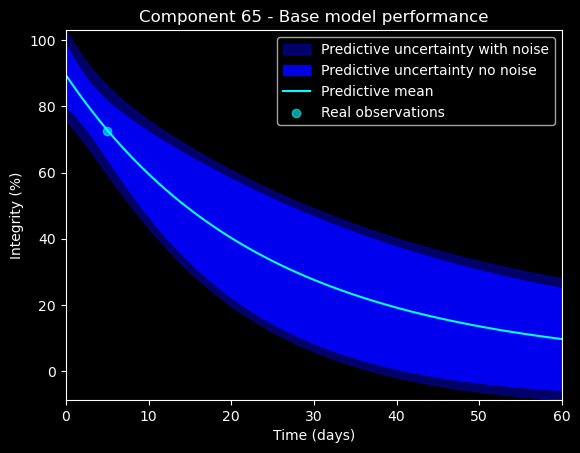

[0.0]


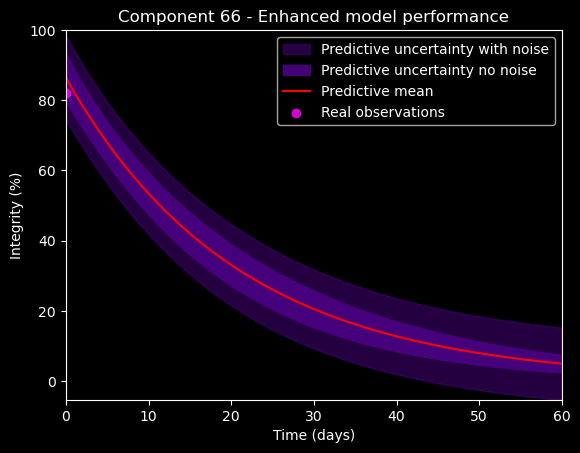

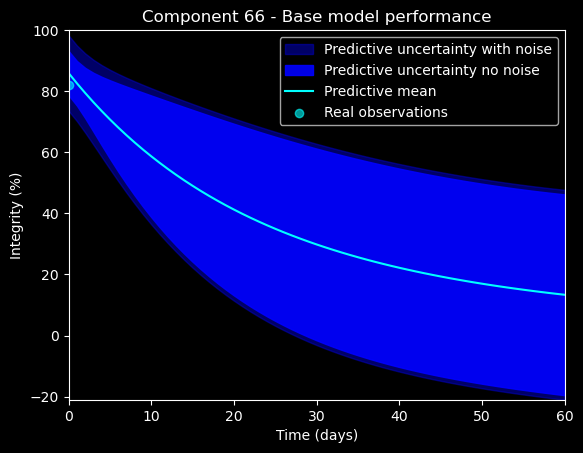

[5.0]


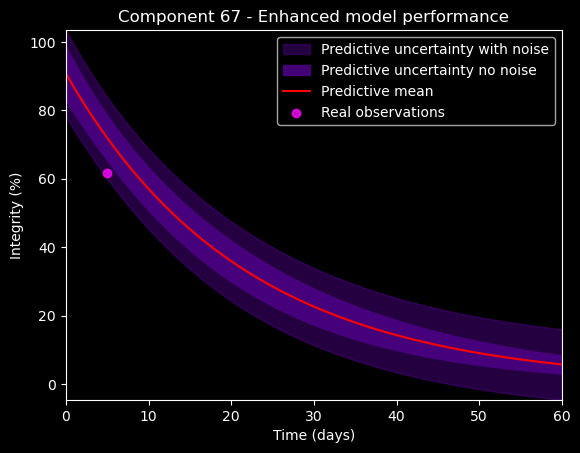

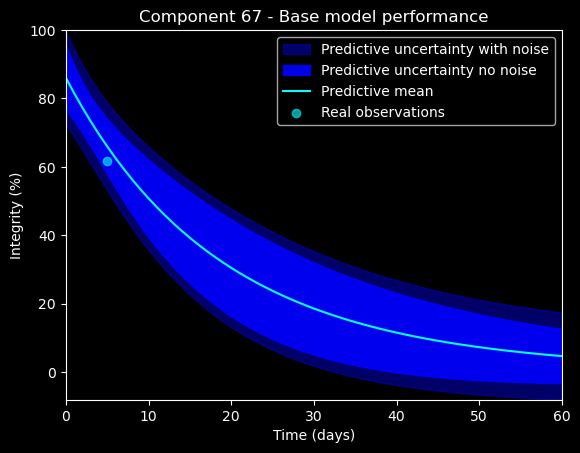

[4.0 7.0 8.0]


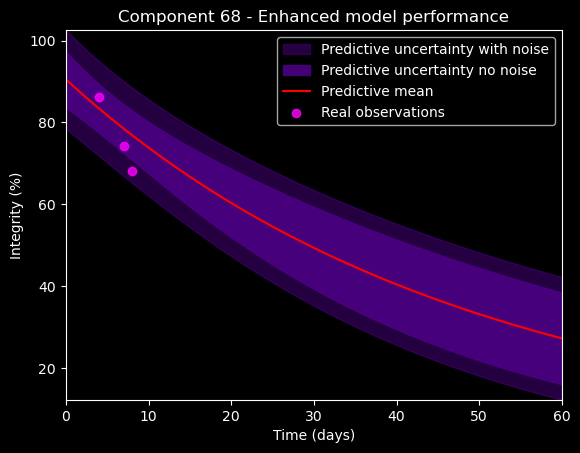

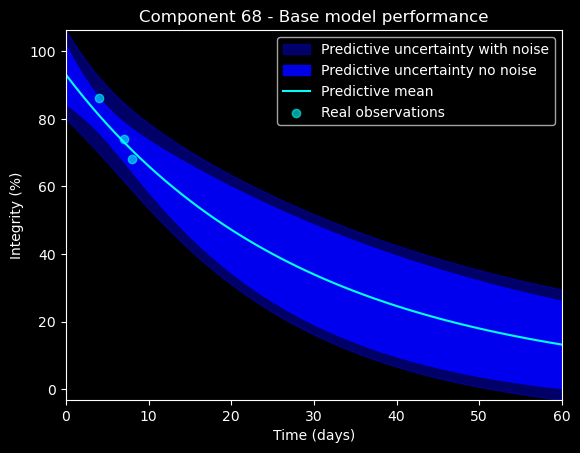

[5.0]


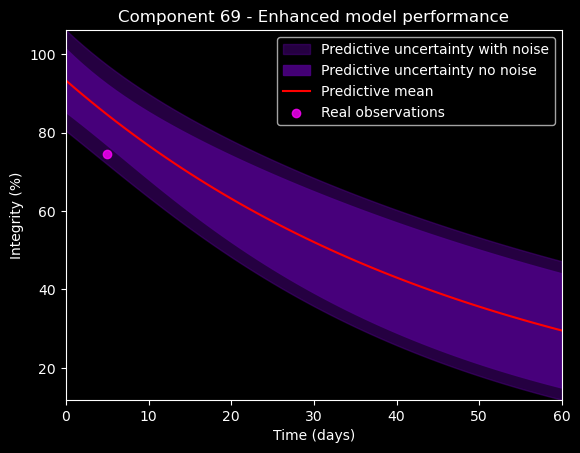

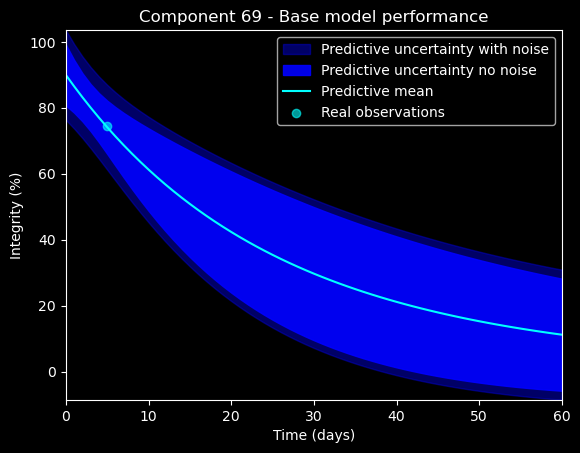

[6.0 7.0]


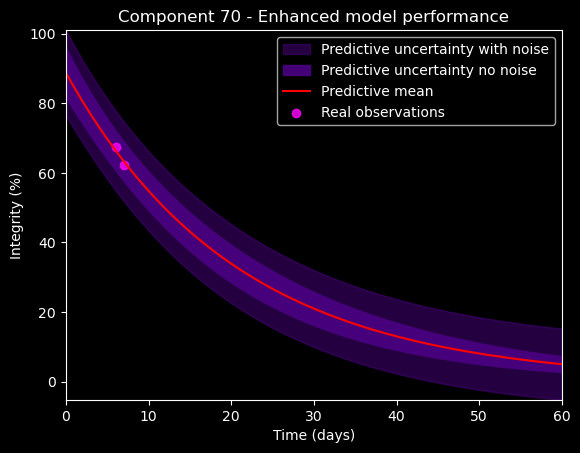

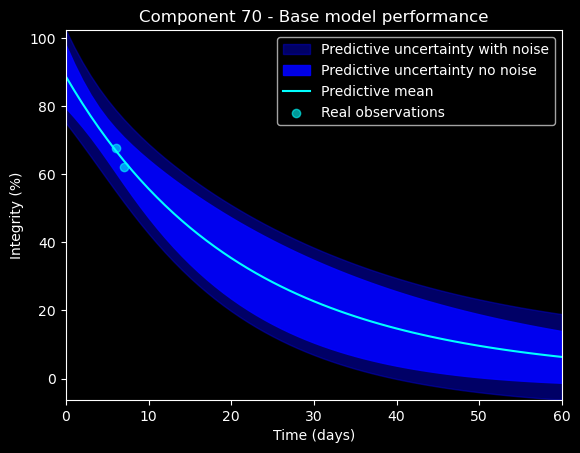

[6.0]


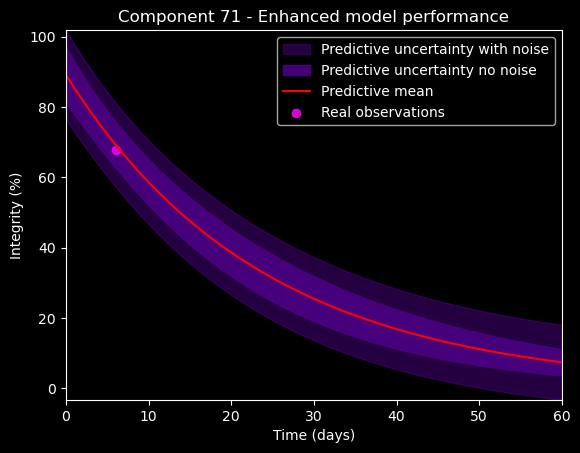

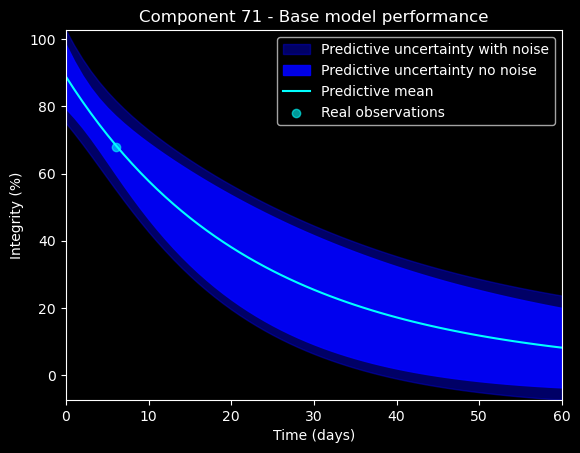

[2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0]


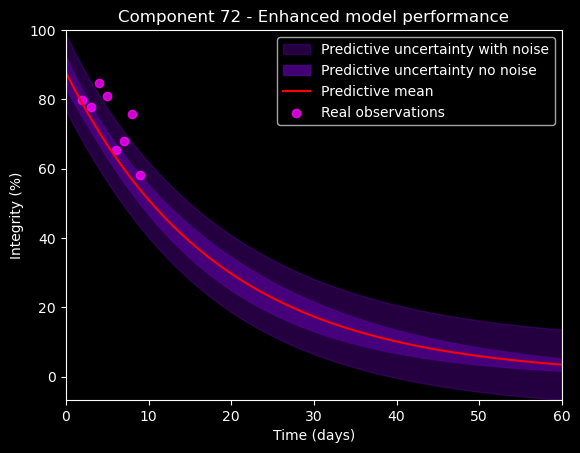

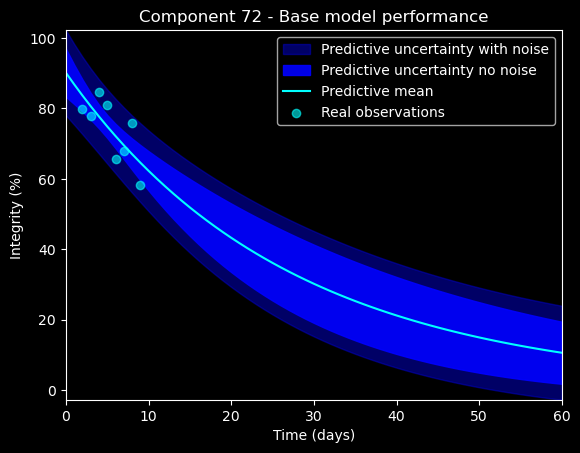

[0.0 3.0 5.0]


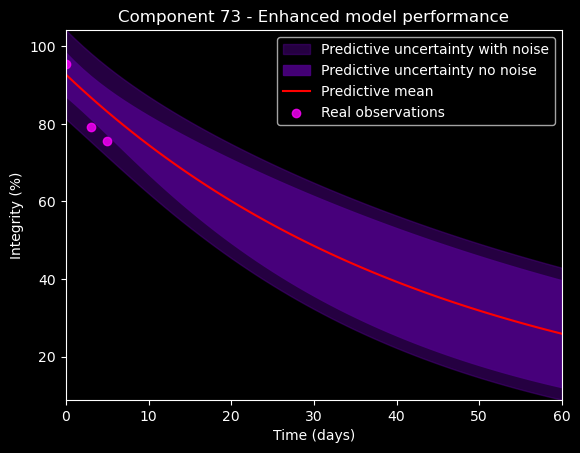

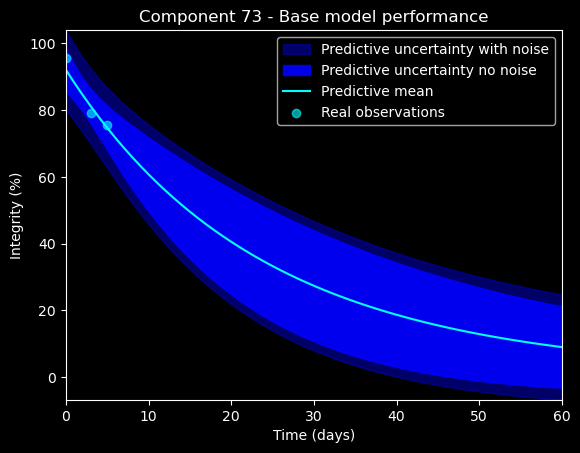

[3.0 6.0 7.0 9.0]


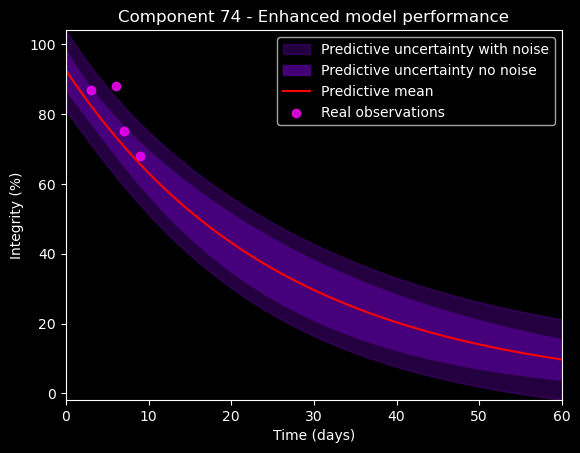

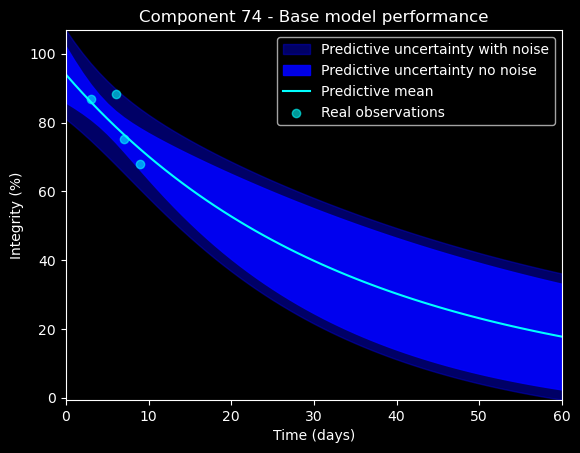

In [32]:
def model_plots(components):
    for k in components:
        enh_i, base_i, lower_i_enhanced, upper_i_enhanced, lower_i_base, upper_i_base, l_e_n, u_e_n, l_b_n, u_b_n, _ = prediction(k)
        if k<10:
            k_i = df[df['ID']==f'K#000{k}'].to_numpy()
        else:
            k_i = df[df['ID']==f'K#00{k}'].to_numpy()

        
        obs_real = k_i[:, -1]
        
        dates = k_i[:, -2]
        print(dates)
        plt.style.use('dark_background')
        plt.title(f'Component {k} - Enhanced model performance')
        plt.fill_between([i for i in range(61)], l_e_n, u_e_n, alpha=0.5, color='indigo')
        plt.fill_between([i for i in range(61)], lower_i_enhanced, upper_i_enhanced, alpha=0.9, color='indigo')
        plt.plot(enh_i, c='r')
        plt.scatter([d for d in dates],obs_real, c='fuchsia', alpha=0.8)
        plt.legend(['Predictive uncertainty with noise','Predictive uncertainty no noise', 'Predictive mean','Real observations'])
        plt.xlim((0, 60))
        plt.ylim(min(l_e_n),max((max(u_e_n),100)))
        plt.xlabel('Time (days)')
        plt.ylabel('Integrity (%)')
        plt.show()

        plt.title(f'Component {k} - Base model performance')
        plt.fill_between([i for i in range(61)], l_b_n, u_b_n, alpha=0.5, color='mediumblue')
        plt.fill_between([i for i in range(61)], lower_i_base, upper_i_base, alpha=0.9, color='blue')
        plt.plot(base_i, c='cyan')
        plt.scatter([d for d in dates],obs_real,  c='aqua', alpha=0.6)
        plt.legend(['Predictive uncertainty with noise','Predictive uncertainty no noise', 'Predictive mean','Real observations'])
        plt.xlim((0, 60))
        plt.ylim((min(l_b_n),max(100, max(u_b_n))))
        plt.xlabel('Time (days)')
        plt.ylabel('Integrity (%)')
        plt.show()

model_plots([i for i in range(0, 75)])


### Black box creation

[87.19097027 -5.06669547]


/Users/victorprelici/miniconda3/envs/BMLCW2/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


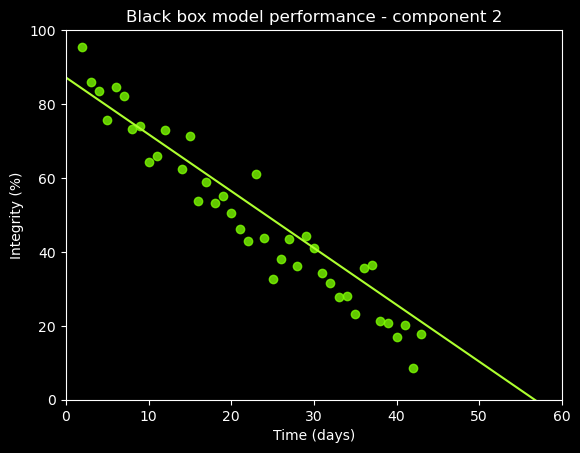

[90.69668653 -1.37439384]


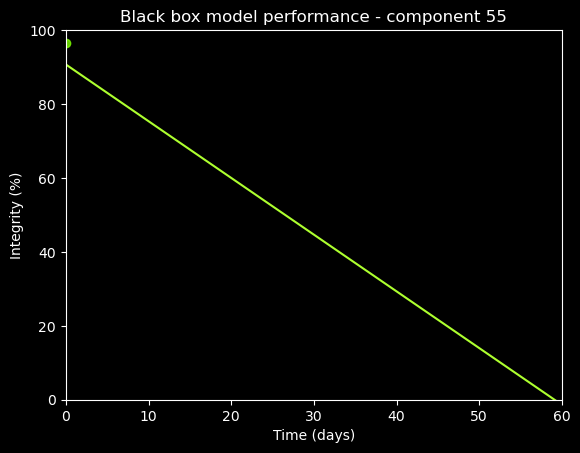

[93.63186339 -2.92099542]


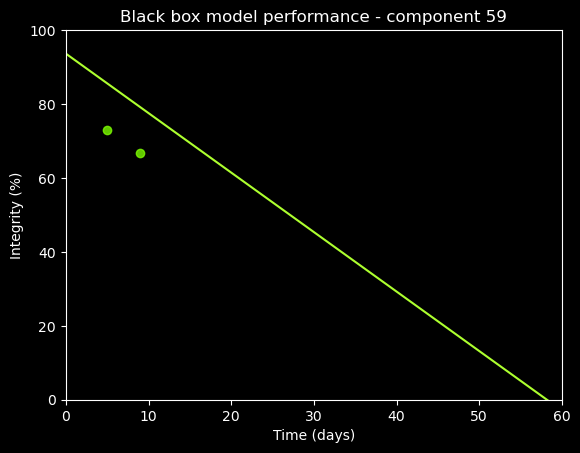

[ 85.79558761 -16.19410076]


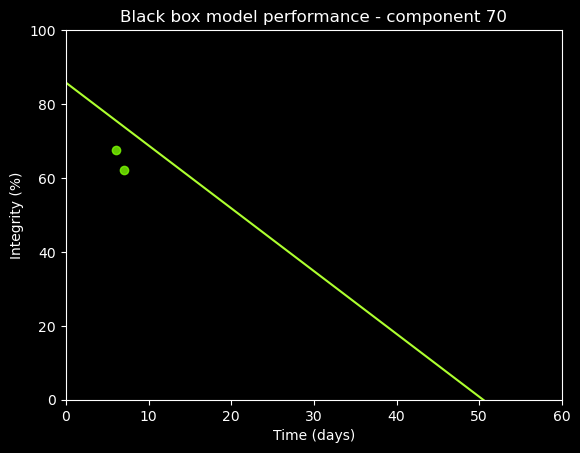

In [33]:
X_dataset_train = df[['X1','X2','X3','X4','X5', 'day']].to_numpy()[:806]

y_dataset_train = df['integrity'].to_numpy()[:806]

np.random.seed(9)

X_dataset_test = df[['X1','X2','X3','X4','X5', 'day']].to_numpy()[806:]
y_dataset_test = df['integrity'].to_numpy()[806:]
training_data = []
testing_data = []


model = MLPRegressor(hidden_layer_sizes=(6, 1), activation='relu', solver='lbfgs')
fitted=model.fit(X_dataset_train, y_dataset_train)


#diff = predicted_regression - y_dataset_test




artificial = np.array(features_unique[:])
zero_time = np.ones(shape=(artificial.shape[0])) * 0
thirty_time = np.ones(shape=(artificial.shape[0])) * 60

artificial_0 = np.concatenate((artificial,zero_time.reshape(-1, 1) ), axis=1)
artificial_30 = np.concatenate((artificial,thirty_time.reshape(-1, 1) ), axis=1)

predicted_regression_0 = model.predict(artificial_0).reshape(-1, 1)
predicted_regression_30 = model.predict(artificial_30).reshape(-1, 1)

predicted_bb = np.concatenate((predicted_regression_0, predicted_regression_30), axis=1)


for i in [2, 55, 59, 70]:
    if i<10:
        k_i = df[df['ID']==f'K#000{i}'].to_numpy()
    else:
        k_i = df[df['ID']==f'K#00{i}'].to_numpy()

    obs_real = k_i[:, -1]
        
    dates = k_i[:, -2]

    plt.style.use('dark_background')
    plt.scatter([d for d in dates], obs_real, c='lawngreen', alpha=0.8)
    plt.plot([0, 60],predicted_bb[i], c='greenyellow')
    print(predicted_bb[i])
    plt.title(f'Black box model performance - component {i}')
    plt.ylabel('Integrity (%)')
    plt.xlabel('Time (days)')
    plt.ylim((0, 100))
    plt.xlim((0, 60))
    plt.show()

